In [172]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
from scipy.integrate import solve_ivp
import time

# Introduction to LMS and RLS

In this assignment, I was tasked to revisit the adaptive filtering work from Assignment 2, where I used the Least Mean Squares (LMS) algorithm on noisy data. This time, I was asked to extend the analysis by applying the Recursive Least Squares (RLS) algorithm in parallel. The objective is to compare LMS and RLS in terms of their performance, speed of convergence, and suitability for different types of signals and tasks.

The LMS algorithm is widely used because it is simple and computationally efficient. However, LMS struggles in situations where the input signal changes rapidly or when fast convergence is needed. This is because LMS uses a fixed step size, making it slower to adapt to changes. RLS addresses these issues by explicitly solving a weighted least squares problem at each step. It uses all past data to adjust the filter weights, allowing it to adapt much faster than LMS.

To highlight these differences, I applied both algorithms to synthetic signals with varying characteristics. For example:
- RLS performs better in non-stationary environments where the signal changes abruptly.
- LMS, being computationally less expensive, is better suited for steady-state signals or scenarios with limited resources.

After analyzing these differences with signals, I extended the comparison to image denoising tasks from Assignment 2. This allowed me to assess their effectiveness in practical, real-world scenarios and understand when to use one over the other.

---

## LMS and RLS: Formulas and Differences

### LMS Algorithm
The LMS algorithm updates the filter weights to minimize the error between the desired signal and the actual output. The weight update formula is:

$$
\hat{w}(n+1) = \hat{w}(n) + \mu \cdot \xi(n) \cdot \mathbf{u}(n)
$$

Where:
- $\hat{w}(n)$: Filter weights at step $n$.
- $\mu$: Step size (learning rate).
- $\xi(n)$: Error signal, calculated as $d(n) - \hat{w}^H(n) \cdot \mathbf{u}(n)$.
- $\mathbf{u}(n)$: Input signal.
- $d(n)$: Desired signal.

**Advantages**:
- Simple and computationally efficient.
- Works well for steady-state or slowly changing signals.

**Limitations**:
- Convergence is slow in non-stationary environments.
- Sensitive to the choice of step size $\mu$.

---

### RLS Algorithm
The RLS algorithm minimizes the weighted least squares error by using all past input data. It updates the filter weights as follows:

1. **Initialization**:
   - $\hat{w}(0) = 0$
   - $P(0) = \delta I$, where $\delta$ is a positive constant and $I$ is the identity matrix.

2. **Recursive Updates** (for $n = 1, 2, \dots$):
   - **Gain vector**:
     $$
     \mathbf{k}(n) = \frac{\lambda^{-1} P(n-1) \mathbf{u}(n)}{1 + \lambda^{-1} \mathbf{u}^H(n) P(n-1) \mathbf{u}(n)}
     $$
   - **Error signal**:
     $$
     \xi(n) = d(n) - \hat{w}^H(n-1) \mathbf{u}(n)
     $$
   - **Weight update**:
     $$
     \hat{w}(n) = \hat{w}(n-1) + \mathbf{k}(n) \xi(n)
     $$
   - **Correlation matrix update**:
     $$
     P(n) = \lambda^{-1} P(n-1) - \lambda^{-1} \mathbf{k}(n) \mathbf{u}^H(n) P(n-1)
     $$

Where:
- $\lambda$: Forgetting factor, typically close to 1 (e.g., 0.98–1).
- $P(n)$: Inverse correlation matrix.
- $\mathbf{u}(n)$ and $d(n)$: Input and desired signals at step $n$.

**Advantages**:
- Fast convergence, especially in non-stationary environments.
- Adapts well to abrupt signal changes.

**Limitations**:
- Computationally intensive and requires more memory.
- Sensitive to the choice of the forgetting factor $\lambda$.

---

## Key Differences Between LMS and RLS

1. **Convergence Speed**:
   - LMS converges slowly, especially in non-stationary environments.
   - RLS converges much faster, making it ideal for dynamic signals.

2. **Computational Complexity**:
   - LMS is computationally simple, with $O(N)$ complexity.
   - RLS is more complex, with $O(N^2)$ due to matrix operations.

3. **Robustness to Non-Stationary Signals**:
   - LMS struggles with abrupt signal changes.
   - RLS handles such situations effectively.

4. **Memory Requirements**:
   - LMS requires minimal memory.
   - RLS requires more memory for storing and updating the inverse correlation matrix.

---

## Motivation for New Dataset

To fully explore the differences between LMS and RLS, I applied both algorithms to synthetic signals with varying characteristics:
- Signals with abrupt changes challenge the ability of RLS to adapt quickly.
- Steady-state signals demonstrate the efficiency of LMS in stable environments.

Finally, I extended the analysis to image denoising tasks, such as those in Assignment 2. This allowed me to compare the practical performance of LMS and RLS in real-world scenarios and identify the strengths and limitations of each algorithm. This exploration helps determine the best use cases for LMS and RLS and provides a deeper understanding of their behavior under different conditions.

In [25]:
def LMS(u, d, w, M, totSamples, miu):
    
    evec = np.zeros(totSamples)  # error vector
    error_changes = []  # error changes over iterations
    prev_error = np.inf  # previous total error

    for nn in range(M - 1, totSamples - 1):
        un = np.array(u[nn - M + 1: nn + 1][::-1])  # input window
        yn = np.dot(w[nn, :], un)  # filter output
        
        ee = d[nn] - yn  # calculate error
        evec[nn] = ee  # store error
        
        w[nn + 1, :] = w[nn, :] + miu * ee * un  # weight update
        
        current_error = np.sum(evec**2)  # total squared error
        error_change = abs(current_error - prev_error)  # error change
        error_changes.append(error_change)  # store error change
        prev_error = current_error  # update previous error

    return w, evec, error_changes  # return weights, error vector, and error changes

In [27]:
def RLS(u, d, M, totSamples, Lambda=0.99, delta=1e-3):
    evec = np.zeros(totSamples)  # error vector
    error_changes = []  # error changes over iterations
    prev_error = np.inf  # previous total error
    P = np.zeros((totSamples, M, M))  # store inverse correlation matrix
    k = np.zeros((totSamples, M))  # store kalman gain
    w = np.zeros((totSamples, M))  # store weights

    P[M-1, :, :] = delta**-1 * np.eye(M)  # initialize P for first valid index

    for nn in range(M, totSamples):  # loop through samples
        u_n = u[nn - M + 1: nn + 1][::-1]  # input window
        yn = np.dot(w[nn - 1, :], u_n)  # filter output
        ee = d[nn] - yn  # calculate error
        evec[nn] = ee  # store error
        k[nn, :] = np.dot(P[nn - 1, :, :], u_n) / (Lambda + np.dot(u_n.T, np.dot(P[nn - 1, :, :], u_n)))  # kalman gain
        w[nn, :] = w[nn - 1, :] + ee * k[nn, :]  # update weights
        P[nn, :, :] = (1 / Lambda) * (P[nn - 1, :, :] - np.outer(k[nn, :], np.dot(u_n.T, P[nn - 1, :, :])))  # update P

        current_error = np.sum(evec**2)  # total squared error
        error_change = abs(current_error - prev_error)  # error change
        error_changes.append(error_change)  # store error change
        prev_error = current_error  # update previous error

    return w, evec, error_changes, P, k  # return weights, error vector, error changes, P, and k

In [29]:
def plot_lms_rls_comparison(t, signal, noise, noisy_signal, filtered_signal_LMS, filtered_signal_RLS, newW_LMS, newW_RLS, LMSErr, RLSErr, error_changes_LMS, error_changes_RLS, M, miu_LMS, Lambda):
    # Error and weight evolution plots
    plt.figure(figsize=(20, 12))
    
    # Instantaneous Error Magnitude
    plt.subplot(4, 2, 1)
    plt.plot(abs(LMSErr), color='purple')
    plt.title(f"LMS: Instantaneous Error Magnitude (M={M}, miu={miu_LMS})")
    plt.xlabel("Iteration")
    plt.ylabel("Error Magnitude")
    plt.grid(True)
    
    plt.subplot(4, 2, 2)
    plt.plot(abs(RLSErr), color='blue')
    plt.title(f"RLS: Instantaneous Error Magnitude (M={M}, Lambda={Lambda})")
    plt.xlabel("Iteration")
    plt.ylabel("Error Magnitude")
    plt.grid(True)
    
    # Error Change Over Iterations
    plt.subplot(4, 2, 3)
    plt.plot(error_changes_LMS, color='purple')
    plt.title("LMS: Error Change Over Iterations")
    plt.xlabel("Iteration")
    plt.ylabel("Change in Error")
    plt.grid(True)
    
    plt.subplot(4, 2, 4)
    plt.plot(error_changes_RLS, color='blue')
    plt.title("RLS: Error Change Over Iterations")
    plt.xlabel("Iteration")
    plt.ylabel("Change in Error")
    plt.grid(True)
    
    # Weight Evolution
    plt.subplot(4, 2, 5)
    plt.plot(newW_LMS[:, M - 1], color='red', label=r'$W_{vec}$')  # LMS weights
    plt.axhline(y=1 / M, color='brown', linestyle='--', label=r'$1/M$')  # Reference line
    plt.title(f"LMS: Last Weight Evolution (M={M}, miu={miu_LMS})")
    plt.xlabel("Iterations")
    plt.ylabel(r"$W_{vec,i}$")
    plt.grid(True)
    plt.legend()
    
    plt.subplot(4, 2, 6)
    plt.plot(newW_RLS[:, M - 1], color='blue', label=r'$W_{vec}$')  # RLS weights
    plt.axhline(y=1 / M, color='brown', linestyle='--', label=r'$1/M$')  # Reference line
    plt.title(f"RLS: Last Weight Evolution (M={M}, Lambda={Lambda})")
    plt.xlabel("Iterations")
    plt.ylabel(r"$W_{vec,i}$")
    plt.grid(True)
    plt.legend()
    
    # All Weight Evolutions
    plt.subplot(4, 2, 7)
    for i in range(M):
        plt.plot(newW_LMS[:, i])
    plt.title("LMS: All Weight Evolutions")
    plt.xlabel("Iteration")
    plt.ylabel("Weight Values")
    plt.grid(True)
    
    plt.subplot(4, 2, 8)
    for i in range(M):
        plt.plot(newW_RLS[:, i])
    plt.title("RLS: All Weight Evolutions")
    plt.xlabel("Iteration")
    plt.ylabel("Weight Values")
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

    # Signal comparison plots
    plt.figure(figsize=(12, 12))
    
    # Original signal
    plt.subplot(6, 1, 1)
    plt.plot(t, signal, color='blue', label='Original Signal')
    plt.title("Original Signal")
    plt.grid(True)
    
    # Noisy signal
    plt.subplot(6, 1, 2)
    plt.plot(t, noisy_signal, color='red', alpha=0.7, label='Noisy Signal')
    plt.title("Noisy Signal")
    plt.grid(True)
    
    # Original vs LMS filtered signal
    plt.subplot(6, 1, 3)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='green', alpha=0.8)
    plt.title("LMS: Original vs Filtered Signal")
    plt.grid(True)
    plt.legend()
    
    # Original vs RLS filtered signal
    plt.subplot(6, 1, 4)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_RLS, label='RLS Filtered Signal', color='purple', alpha=0.8)
    plt.title("RLS: Original vs Filtered Signal")
    plt.grid(True)
    plt.legend()
    
    # Noisy vs LMS filtered signal
    plt.subplot(6, 1, 5)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='red', alpha=0.7)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='green', alpha=0.7)
    plt.title("LMS: Noisy vs Filtered Signal")
    plt.grid(True)
    plt.legend()
    
    # Noisy vs RLS filtered signal
    plt.subplot(6, 1, 6)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='red', alpha=0.7)
    plt.plot(t, filtered_signal_RLS, label='RLS Filtered Signal', color='purple', alpha=0.7)
    plt.title("RLS: Noisy vs Filtered Signal")
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Zoomed comparison: LMS and RLS
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='green', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("LMS: Original vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(t, signal, label='Original Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_RLS, label='RLS Filtered Signal', color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("RLS: Original vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_LMS, label='LMS Filtered Signal', color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("LMS: Noisy vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(t, noisy_signal, label='Noisy Signal', color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_RLS, label='RLS Filtered Signal', color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)
    plt.title("RLS: Noisy vs Filtered Signal (Zoomed)")
    plt.grid(True)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

In [45]:
def run_lms_rls_comparison(signal, t, M, miu_LMS, Lambda, delta, noise_level=None, custom_noise=None):
    # Generate noise if not provided
    if custom_noise is None:
        noise = np.random.normal(0, noise_level, len(t))  # generate Gaussian noise
    else:
        noise = custom_noise  # use provided custom noise

    noisy_signal = signal + noise  # add noise to the signal

    totSamples = len(noisy_signal)
    w_LMS = np.zeros((totSamples, M))  # LMS weights
    w_RLS = np.zeros((totSamples, M))  # RLS weights

    d = signal  # desired signal
    u = noisy_signal  # input signal (noisy)

    # Apply LMS
    newW_LMS, LMSErr, error_changes_LMS = LMS(u, d, w_LMS, M, totSamples, miu_LMS)
    filtered_signal_LMS = np.zeros_like(u)  # initialize LMS filtered signal
    for i in range(M, totSamples):
        filtered_signal_LMS[i] = np.dot(newW_LMS[-1, :], u[i - M + 1: i + 1][::-1])  # LMS output

    # Apply RLS
    newW_RLS, RLSErr, error_changes_RLS, _, _ = RLS(u, d, M, totSamples, Lambda, delta)
    filtered_signal_RLS = np.zeros_like(u)  # initialize RLS filtered signal
    for i in range(M, totSamples):
        filtered_signal_RLS[i] = np.dot(newW_RLS[-1, :], u[i - M + 1: i + 1][::-1])  # RLS output

    # Visualize results
    plot_lms_rls_comparison(
        t=t,
        signal=signal,
        noise=noise,
        noisy_signal=noisy_signal,
        filtered_signal_LMS=filtered_signal_LMS,
        filtered_signal_RLS=filtered_signal_RLS,
        newW_LMS=newW_LMS,
        newW_RLS=newW_RLS,
        LMSErr=LMSErr,
        RLSErr=RLSErr,
        error_changes_LMS=error_changes_LMS,
        error_changes_RLS=error_changes_RLS,
        M=M,
        miu_LMS=miu_LMS,
        Lambda=Lambda
    )

### Example: Using LMS and RLS on the Signal from Assignment 2

In this example, we use the same signal setup from Assignment 2. The signal is a combination of sinusoidal components with added Gaussian noise. We apply both the **LMS** and **RLS** algorithms on this noisy signal to filter it and compare their performances. 

The procedure includes:
1. Generating the original signal and adding Gaussian noise.
2. Applying both LMS and RLS algorithms to the noisy signal.
3. Visualizing the results to compare the filtered signals, weight evolution, and error behaviors. 


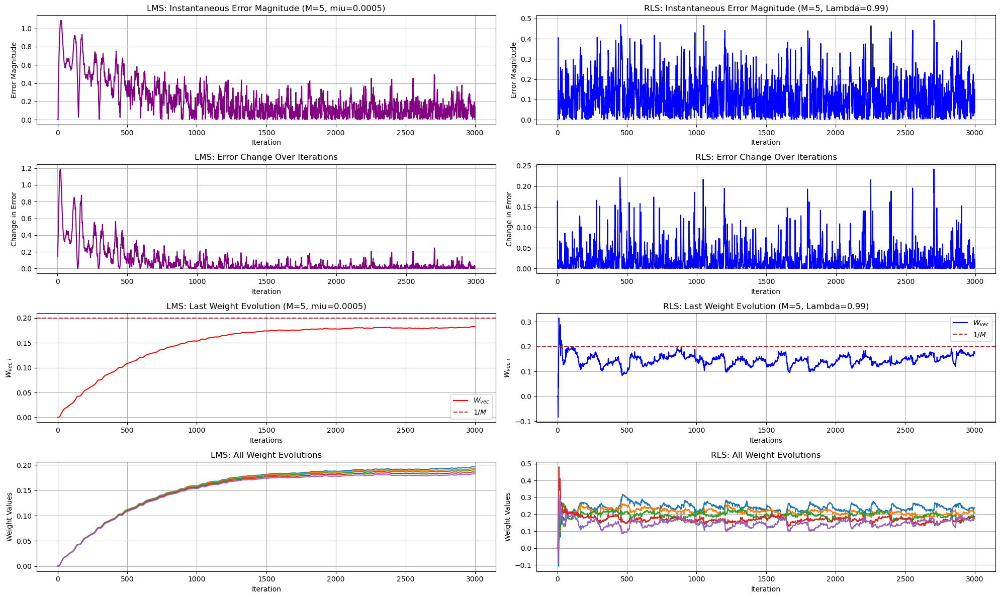

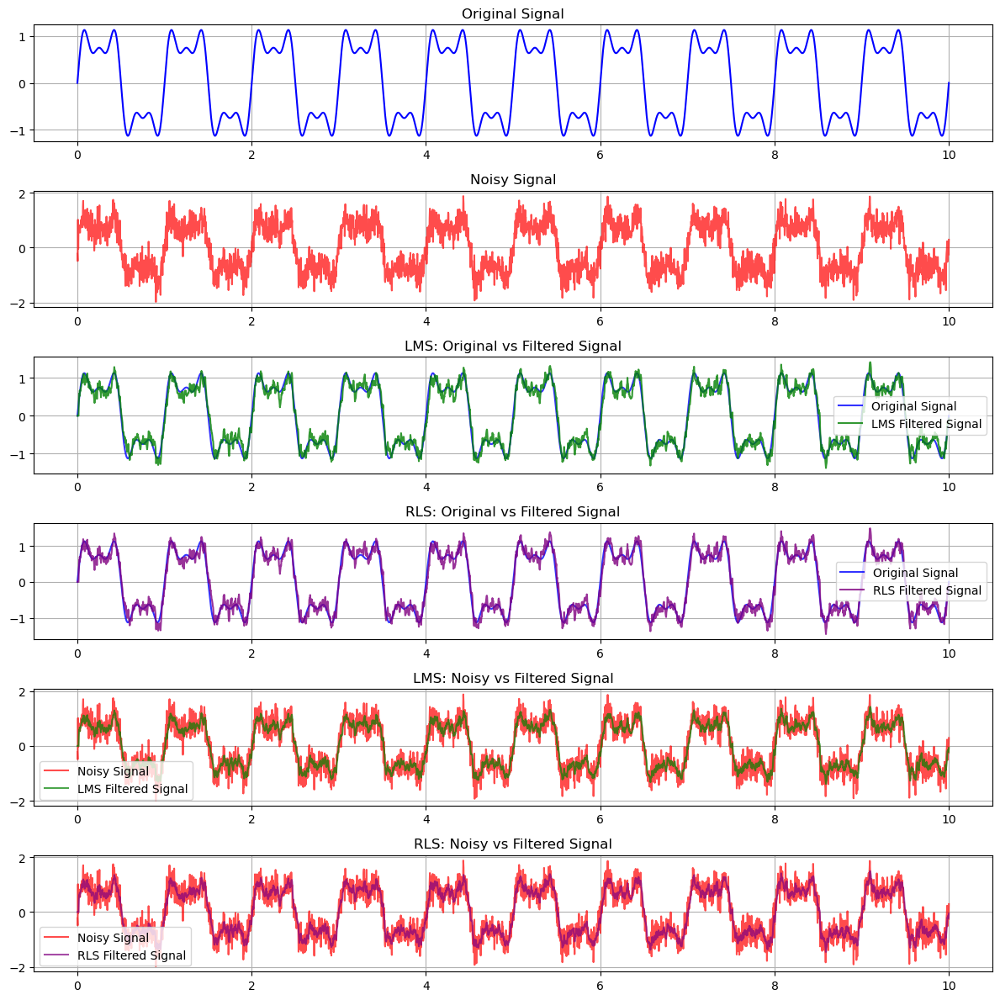

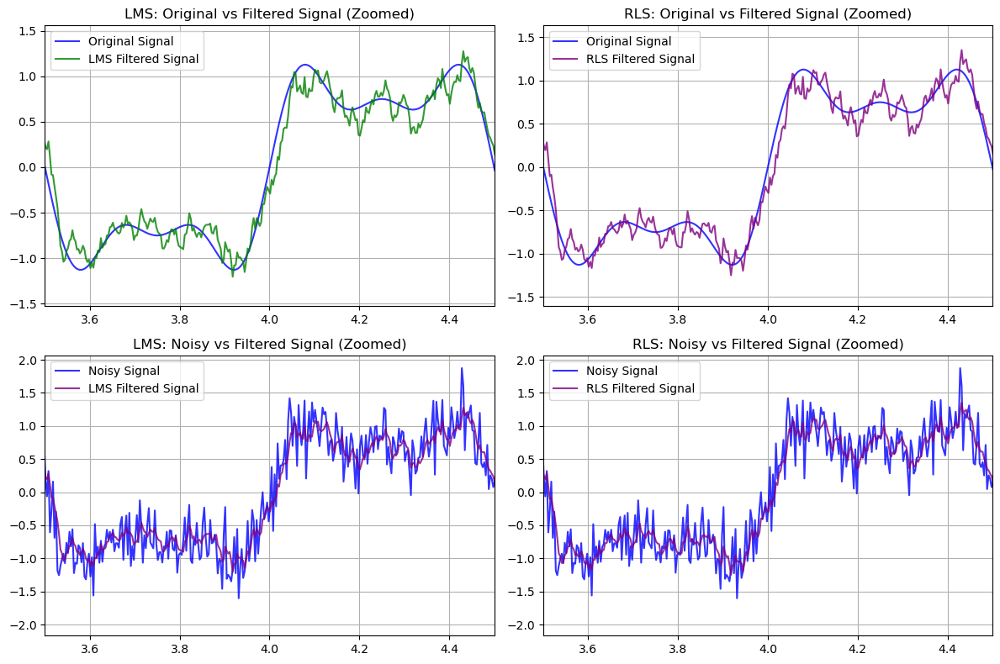

In [47]:
t = np.linspace(0, 10, 3000)  # time vector
signal = (np.sin(2 * np.pi * t) + 
          0.5 * np.sin(2 * np.pi * 3 * t) + 
          0.25 * np.sin(2 * np.pi * 5 * t))  # composite sinusoidal signal

# parameters
M = 5  # number of filter coefficients
miu_LMS = 5e-4  # step size for LMS
Lambda = 0.99  # forgetting factor for RLS
delta = 1e-3  # regularization parameter for RLS
noise_level = 0.3  # noise standard deviation

# run LMS and RLS comparison
run_lms_rls_comparison(signal, t, M, miu_LMS, Lambda, delta, noise_level)

### Key Observations and Analysis:

1. **Instantaneous Error Magnitudes**:
   - **LMS**: The error magnitude starts high (around 1), decreases steadily, and stabilizes over time, reaching around 0.3. This shows gradual learning and stable convergence.
   - **RLS**: The error magnitude starts lower (around 0.5) and fluctuates significantly, but within a range of 0 to 0.3, similar to the end range of LMS. This indicates higher sensitivity to noise or input changes but rapid adaptation.

2. **Error Change Over Iterations**:
   - **LMS**: The error changes start high (around 1.2) and reduce smoothly over time, reflecting gradual learning and stable convergence.
   - **RLS**: The error changes start much lower (around 0.25) and exhibit spikes, fluctuating mostly between 0 and 0.1. This highlights RLS's dynamic nature and faster response to variations, even though it does not stabilize fully.

3. **Last Weight Evolution**:
   - **LMS**: The weights converge smoothly to the expected value (around \(1/M\)) and achieve stable learning. Convergence is mostly achieved around **iteration 300**.
   - **RLS**: The weights stabilize much faster, within the first 50 iterations, but exhibit noticeable oscillations, demonstrating rapid adaptation with some instability.

4. **All Weight Evolutions**:
   - **LMS**: The weights evolve gradually and uniformly, indicating consistent and steady learning. Full convergence is reached around **iteration 300**.
   - **RLS**: The weights adapt rapidly and stabilize within 50 iterations but with fluctuations, reflecting faster convergence but less smooth learning.

---

### Conclusion:
- **Signal Denoising**: Both algorithms effectively denoise the signal, producing similar filtered outputs.
- **LMS**: Provides a smoother and more stable learning process, suitable for steady-state conditions or when gradual convergence is acceptable.
- **RLS**: Adapts much faster, starting with lower errors and error changes, and converging quickly (within 50 iterations). However, it exhibits more sensitivity and fluctuations, making it ideal for dynamic or rapidly changing scenarios.

---

## Next Step: Exploring a Scenario Where RLS Struggles

In the previous example, we observed that **RLS** is faster and adapts more quickly than **LMS**, making it ideal for dynamic or rapidly changing signals. However, finding scenarios where RLS truly struggles is challenging, as it generally performs well in most cases. To push RLS to its limits, the next example will use a combination of:
1. A **chaotic signal** (e.g., the Lorenz system) to introduce unpredictable, non-linear dynamics.
2. A **time-varying modulated signal** to add frequency and amplitude changes.
3. **Severe noise**, including high-amplitude Gaussian noise and sparse impulse noise, to amplify numerical instability.

This scenario can make RLS struggle slightly due to:
1. **Chaotic dynamics**, which introduce non-linear and unpredictable variations that disrupt weight updates.
2. **Extreme noise levels**, which stress the algorithm's ability to adapt accurately.
3. **Numerical instability**, which can occur when the forgetting factor $( \lambda $) and regularization parameter $( \delta $) are set to extreme values.

For this example, we intentionally set $ \lambda = 0.94 $ (lower forgetting factor) and $ \delta = 1 \times 10^{-6} $ (very small regularization) to further challenge RLS by increasing adaptation difficulty and numerical sensitivity.

By comparing LMS and RLS in this extreme setting, we aim to observe how the algorithms handle these challenging conditions and analyze their differences in performance.

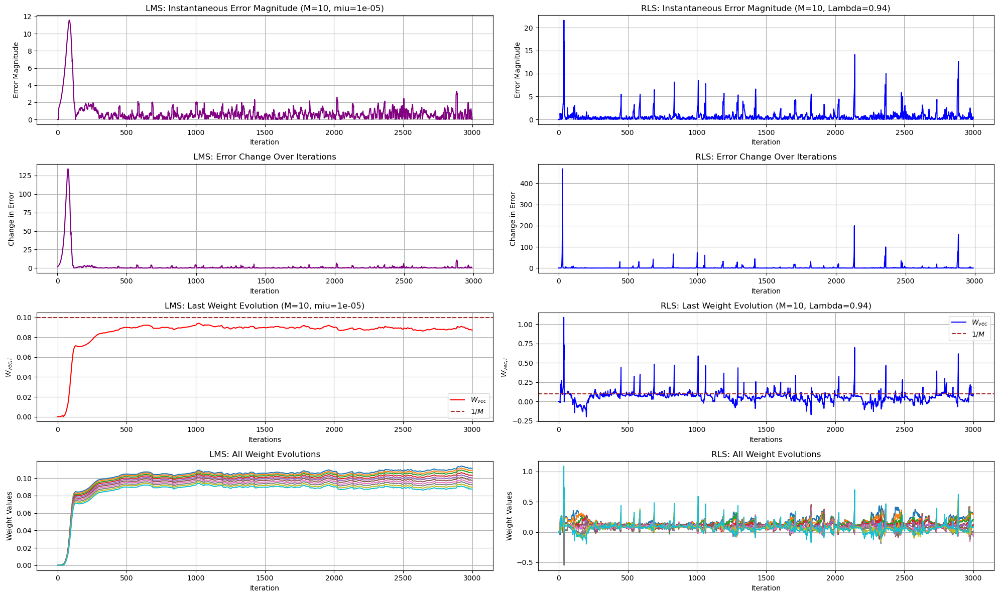

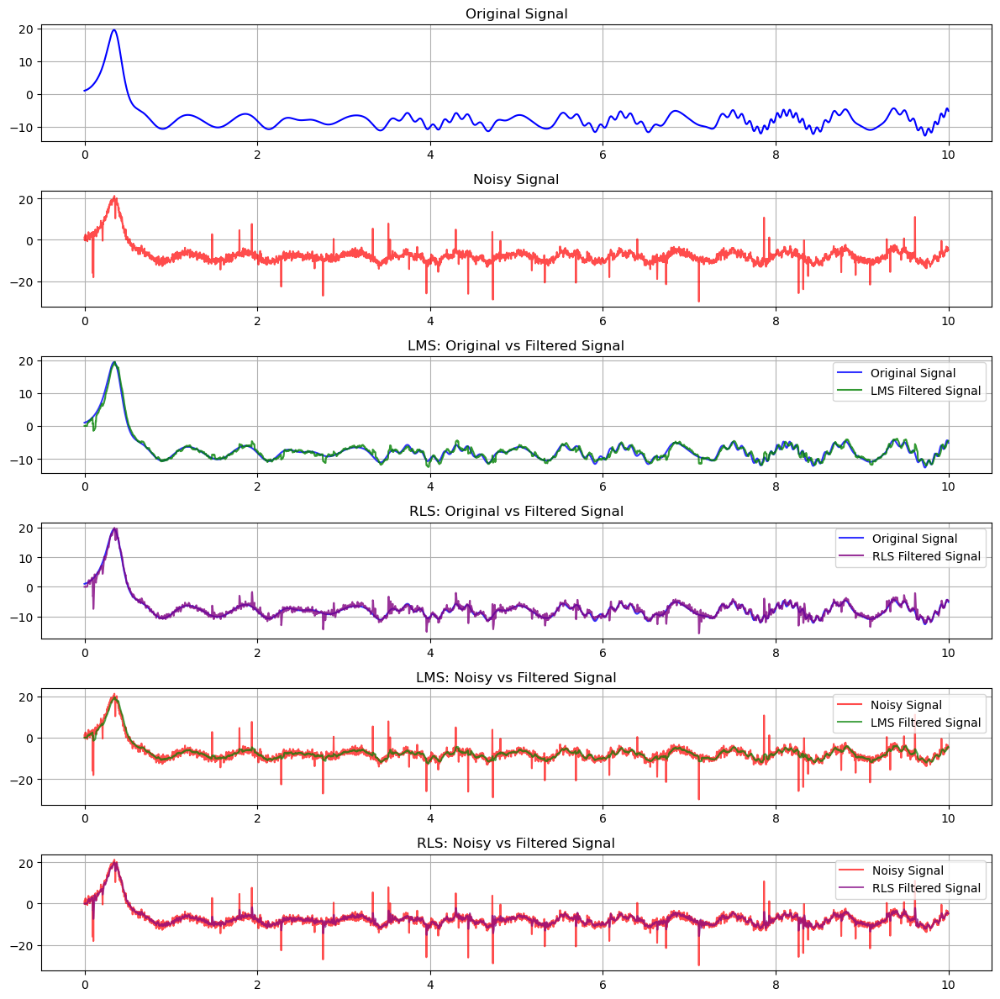

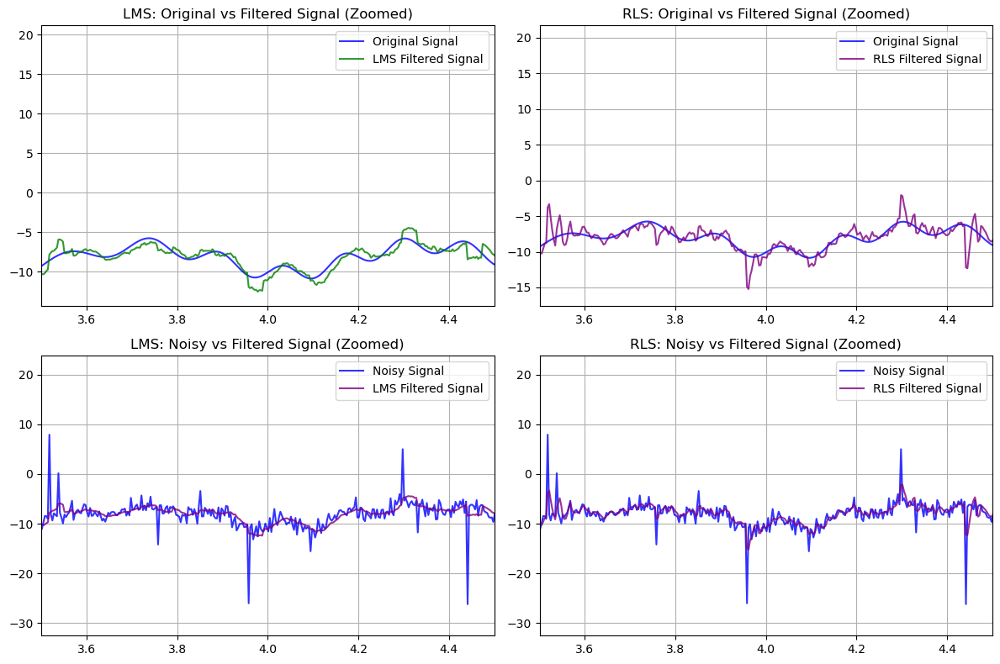

In [116]:
# Generate chaotic Lorenz system signal
def lorenz(t, state):
    sigma = 10  # Lorenz system parameter
    beta = 8 / 3  # Lorenz system parameter
    rho = 28  # Lorenz system parameter
    x, y, z = state  # unpack state variables
    return [sigma * (y - x), x * (rho - z) - y, x * y - beta * z]  # Lorenz system equations

# Solve Lorenz system
t_span = (0, 10)  # time span for the solution
t_eval = np.linspace(0, 10, 3000)  # evaluation time points
initial_state = [1, 1, 1]  # initial conditions for the Lorenz system
solution = solve_ivp(lorenz, t_span, initial_state, t_eval=t_eval)  # solve Lorenz system
lorenz_signal = solution.y[0]  # take x-component as chaotic signal

# Add time-varying frequency modulation
freq_modulation = np.sin(0.5 * np.pi * t_eval)  # modulation frequency
modulated_signal = np.sin(2 * np.pi * (1 + freq_modulation) * t_eval)  # modulated sinusoidal signal

# Combine chaotic signal and modulated signal
signal = lorenz_signal + modulated_signal  # final combined signal

# Add severe noise
gaussian_noise = np.random.normal(0, 1, len(t_eval))  # high-amplitude Gaussian noise
impulse_probability = 0.02  # probability of impulse noise
impulse_noise = np.random.choice([0, 1], size=len(t_eval), p=[1 - impulse_probability, impulse_probability]) * np.random.uniform(-20, 20, len(t_eval))  # sparse impulse noise
custom_noise = gaussian_noise + impulse_noise  # combine Gaussian and impulse noise

# Parameters
M = 10  # filter order
miu_LMS = 1e-5  # step size for LMS
Lambda = 0.94  # forgetting factor for RLS
delta = 1e-6  # regularization parameter for RLS

# Run LMS and RLS comparison
run_lms_rls_comparison(signal, t_eval, M, miu_LMS, Lambda, delta, custom_noise=custom_noise)  # compare LMS and RLS

### Analysis: Comparing LMS Stability and RLS Challenges Under Extreme Conditions

1. **Instantaneous Error Magnitudes**:
   - **LMS**: Handles the problem smoothly, with a large initial error that stabilizes quickly and remains consistent over time.
   - **RLS**: Shows frequent spikes in error magnitudes, indicating instability in handling abrupt noise and chaotic inputs.

2. **Error Change Over Iterations**:
   - **LMS**: Displays a single large error change initially, then converges quickly and maintains smooth learning.
   - **RLS**: Exhibits multiple spikes in error change throughout, reflecting sensitivity to noisy inputs and numerical instability.

3. **Last Weight Evolution**:
   - **LMS**: Weights converge smoothly to the expected value (\(1/M\)) without significant fluctuations.
   - **RLS**: Contains noticeable spikes in weight evolution, caused by the algorithm’s sensitivity to noise and chaotic signal transitions.

4. **All Weight Evolutions**:
   - **LMS**: All weights stabilize uniformly with minimal fluctuations.
   - **RLS**: Weights exhibit persistent oscillations and large deviations, especially in response to noise.

5. **Impact on Denoised Output**:
   - **LMS**: Maintains consistent performance without being affected by spikes or noise, resulting in a clean denoised output.
   - **RLS**: Noise and weight spikes affect the denoised output, demonstrating that the algorithm struggles to maintain stability under extreme conditions.

### Conclusion:
While **LMS** handles this scenario with ease due to its simplicity and smooth convergence, **RLS** struggles with spikes in weights and error changes, especially towards the end, where noise significantly impacts the denoised output. This highlights RLS's sensitivity to numerical instability and extreme inputs.

---

## Next Step: Exploring a Scenario Where LMS Struggles but RLS Excels

In the previous example, we were looking for a complicated problem that could make **RLS struggle**. However, RLS generally performs well and adapts faster in most scenarios, even under challenging conditions. 

Now, we shift focus to an example where **LMS struggles significantly**, but **RLS handles the problem perfectly**. To achieve this, we use a **highly dynamic signal** that features:
1. **Extreme amplitude variations**: Large swings in amplitude across different sections of the signal.
2. **Rapid frequency changes**: Sudden shifts between low and high frequencies, creating abrupt transitions.
3. **Wide dynamic range**: Combining low and high-frequency components with large variations in amplitude, which makes it harder for LMS to converge effectively.

This scenario is designed to highlight LMS's limitations, as it:
- Requires more iterations to adapt to rapid changes due to its slower convergence and fixed step size.
- Struggles to track signals with abrupt transitions and high frequencies.

In contrast, **RLS** excels in this scenario due to:
1. **Rapid adaptability**, allowing it to adjust weights dynamically in response to large changes in amplitude and frequency.
2. **Faster convergence**, which ensures it can handle transitions and high-frequency components with ease.
3. **Stability across dynamic ranges**, maintaining lower errors and better tracking performance.

By comparing LMS and RLS in this setting, we aim to observe how LMS lags significantly behind, while RLS demonstrates its superior ability to handle complex and rapidly changing signals.

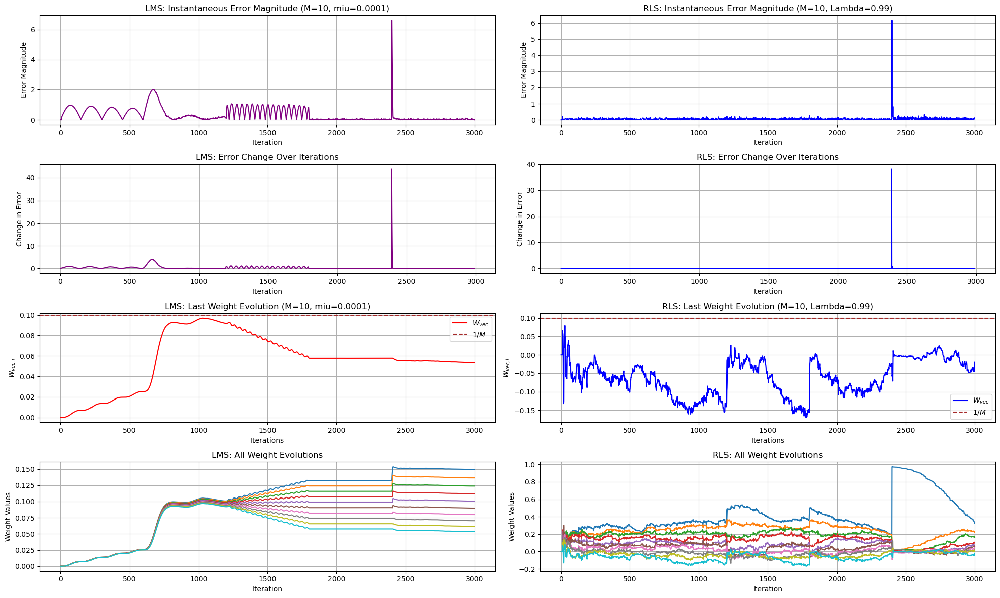

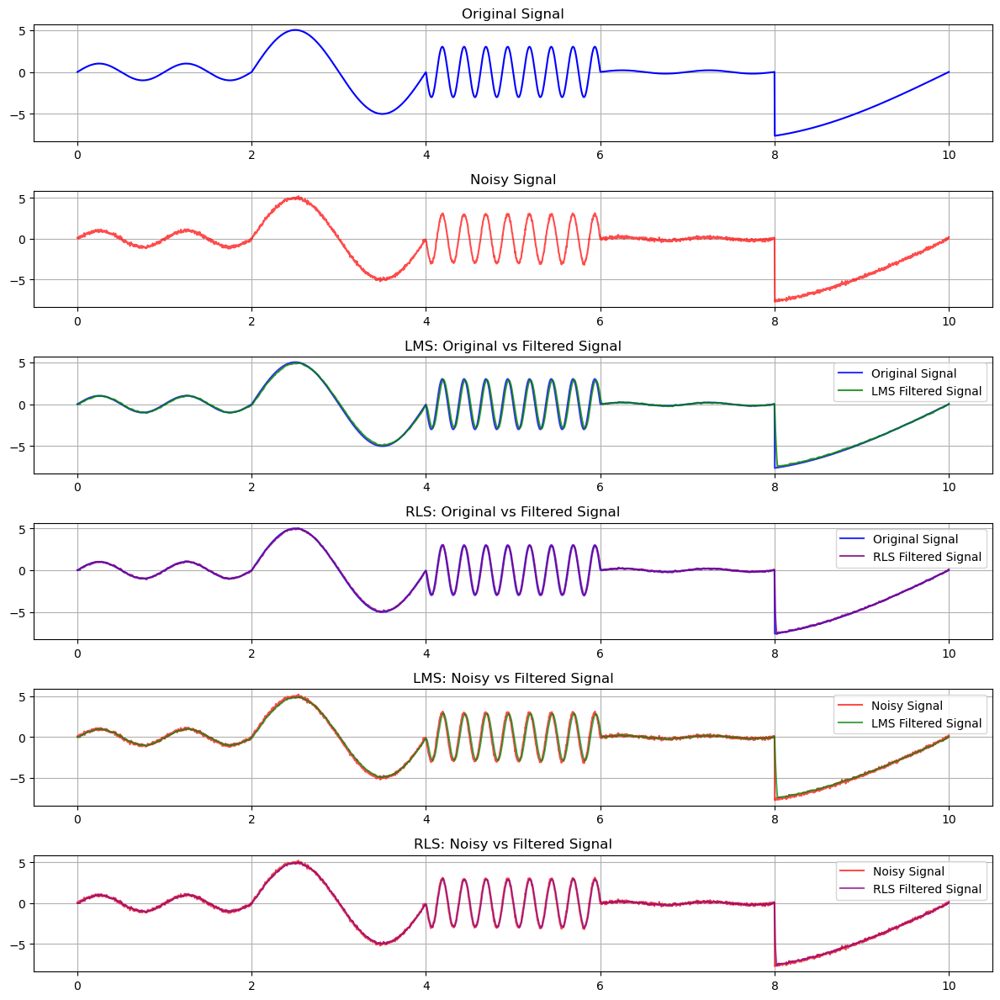

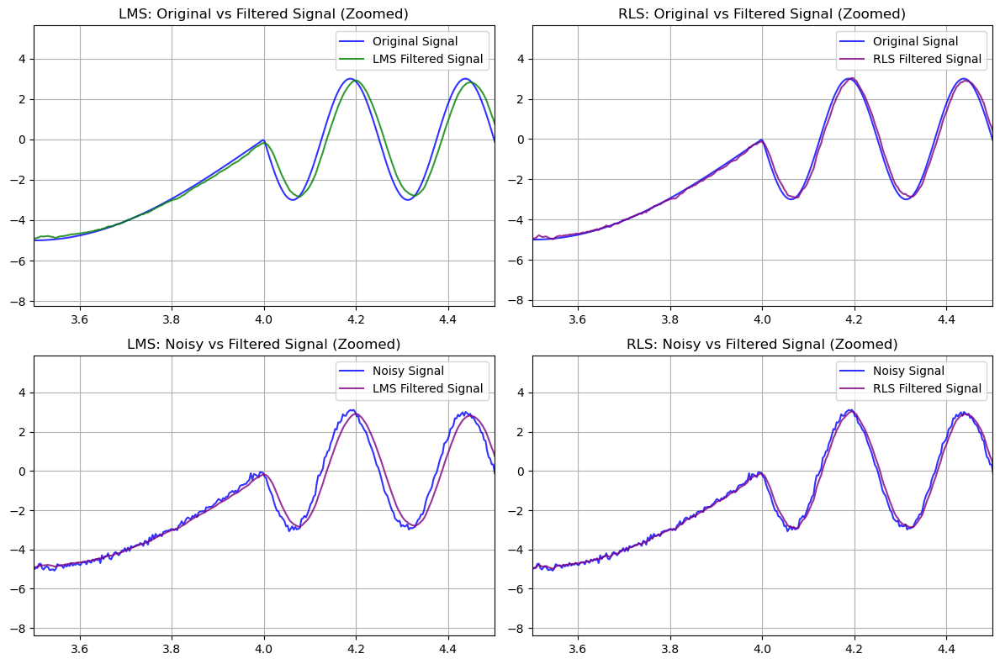

In [142]:
# time vector
t = np.linspace(0, 10, 3000)

# Generate a piecewise signal with extreme changes in amplitude and frequency
signal = np.piecewise(
    t,
    [t < 2, (t >= 2) & (t < 4), (t >= 4) & (t < 6), (t >= 6) & (t < 8), t >= 8],
    [lambda t: np.sin(2 * np.pi * t), 
     lambda t: 5 * np.sin(2 * np.pi * 0.5 * t), 
     lambda t: -3 * np.sin(2 * np.pi * 4 * t), 
     lambda t: 0.2 * np.sin(2 * np.pi * t), 
     lambda t: 8 * np.sin(2 * np.pi * 0.1 * t)]
)

# parameters
M = 10  # number of filter coefficients
miu_LMS = 1e-4  # smaller step size for LMS to ensure stability
Lambda = 0.99  # forgetting factor for RLS
delta = 1e-3  # regularization parameter for RLS
noise_level = 0.1  # low noise level to highlight signal tracking

# Run LMS and RLS comparison
run_lms_rls_comparison(signal, t, M, miu_LMS, Lambda, delta, noise_level)

### Analysis: LMS vs RLS Performance on a Dynamic Signal

#### 1. Instantaneous Error Magnitudes:
- **LMS**:
  - Shows a large initial spike and additional spikes, especially around $t = 2500$.
  - Struggles during transitions, resulting in higher error magnitudes over time.
- **RLS**:
  - Keeps error magnitudes consistently low with only small spikes during transitions.
  - Handles the abrupt changes better than LMS.

#### 2. Error Change Over Iterations:
- **LMS**:
  - Error changes are large during abrupt transitions, especially around $t = 2500$.
  - Indicates difficulty in adapting to sudden changes in the signal.
- **RLS**:
  - Error changes remain small and stable throughout the iterations.
  - Reflects its faster adaptation and better stability.

#### 3. Last Weight Evolution:
- **LMS**:
  - Weights take longer to converge and show instability during transitions.
  - Significant deviations occur around $t = 2500$, indicating difficulty in adapting.
- **RLS**:
  - Weights fluctuate initially but stabilize faster.
  - Maintains smoother adaptation during transitions.

#### 4. All Weight Evolutions:
- **LMS**:
  - Weights vary significantly and fail to stabilize uniformly.
  - Indicates slower and less efficient convergence.
- **RLS**:
  - Weights adapt smoothly and stabilize better over time.

#### 5. Denoised Signal:
- **LMS**:
  - Struggles to follow the abrupt changes in amplitude and frequency.
  - The filtered signal lags behind the original, especially in high-frequency regions ($t = 4$ to $t = 6$).
- **RLS**:
  - Tracks the original signal accurately, even during challenging transitions.
  - The filtered signal aligns closely with the original signal, showing excellent performance.

### Conclusion:
- **LMS**:
  - Has difficulty handling rapid transitions and large amplitude changes.
  - Its slower adaptation leads to higher error and noticeable lag in the filtered signal.
- **RLS**:
  - Performs exceptionally well, adapting quickly to all changes with low error and stable weights.
  - Ideal for dynamic signals with abrupt transitions and large variations.

----

## Next Step: Exploring the Effect of Hyperparameters in RLS

In the previous examples, we looked at cases where each algorithm—LMS and RLS—performed well. However, we saw that **RLS is generally faster, gives better denoising, and finds good weights even in the first few iterations**. This makes RLS work better in most situations, even though both algorithms have their own limitations.

Now, it’s time to see how **RLS hyperparameters** affect its performance. Using the same signal, we will change the **forgetting factor** ($\lambda$) and the **regularization parameter** ($\delta$) to analyze:
1. **How fast it converges**: How quickly RLS adapts to the signal.
2. **Stability**: If small or large values for $\lambda$ and $\delta$ cause unstable weights or errors.
3. **Denoising quality**: How these changes affect the filtered signal.

### Goal:
We want to understand how RLS behaves when we change its hyperparameters and see:
- How error and weights are affected.
- How well it can denoise the signal with different settings.

This will help us learn how to choose the best values for $\lambda$ and $\delta$ for different signals.

In [158]:
def plot_rls_results(
    t,
    signal,
    noisy_signal,
    filtered_signal_RLS,
    newW_RLS,
    RLSErr,
    error_changes_RLS,
    M,
    Lambda,
    delta
):
    # Plot instantaneous error magnitudes and error changes
    plt.figure(figsize=(16, 12))
    
    # Instantaneous Error Magnitude
    plt.subplot(3, 2, 1)
    plt.plot(abs(RLSErr), color='blue')
    plt.title(f"RLS: Instantaneous Error Magnitude (M={M}, Lambda={Lambda}, delta={delta})")
    plt.xlabel("Iteration")
    plt.ylabel("Error Magnitude")
    plt.grid(True)
    
    # Error Change Over Iterations
    plt.subplot(3, 2, 2)
    plt.plot(error_changes_RLS, color='blue')
    plt.title(f"RLS: Error Change Over Iterations (M={M}, Lambda={Lambda}, delta={delta})")
    plt.xlabel("Iteration")
    plt.ylabel("Change in Error")
    plt.grid(True)
    
    # Last Weight Evolution
    plt.subplot(3, 2, 3)
    plt.plot(newW_RLS[:, M - 1], color='blue', label=r'$W_{vec}$')
    plt.axhline(y=1 / M, color='brown', linestyle='--', label=r'$1/M$')  # reference line
    plt.title(f"RLS: Last Weight Evolution (M={M}, Lambda={Lambda}, delta={delta})")
    plt.xlabel("Iterations")
    plt.ylabel(r"$W_{vec,i}$")
    plt.grid(True)
    plt.legend()
    
    # All Weight Evolutions
    plt.subplot(3, 2, 4)
    for i in range(M):
        plt.plot(newW_RLS[:, i])
    plt.title(f"RLS: All Weight Evolutions (M={M}, Lambda={Lambda}, delta={delta})")
    plt.xlabel("Iteration")
    plt.ylabel("Weight Values")
    plt.grid(True)
    
    # Noisy vs Filtered Signal
    plt.subplot(3, 2, 5)
    plt.plot(t, noisy_signal, label="Noisy Signal", color='red', alpha=0.7)
    plt.plot(t, filtered_signal_RLS, label="RLS Filtered Signal", color='purple', alpha=0.8)
    plt.title(f"RLS: Noisy vs Filtered Signal (M={M}, Lambda={Lambda}, delta={delta})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.legend()
    
    # Original vs Filtered Signal (Zoomed)
    plt.subplot(3, 2, 6)
    plt.plot(t, signal, label="Original Signal", color='blue', alpha=0.8)
    plt.plot(t, filtered_signal_RLS, label="RLS Filtered Signal", color='purple', alpha=0.8)
    plt.xlim(3.5, 4.5)  # Zoomed-in region
    plt.title(f"RLS: Original vs Filtered Signal (Zoomed, Lambda={Lambda}, delta={delta})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.legend()
    
    plt.tight_layout()

    plt.savefig(f"RLS_Results_Lambda_{Lambda}_Delta_{delta}.png", dpi=300, bbox_inches='tight')
    plt.show()

Running RLS with Lambda=0.99 and delta=0.001


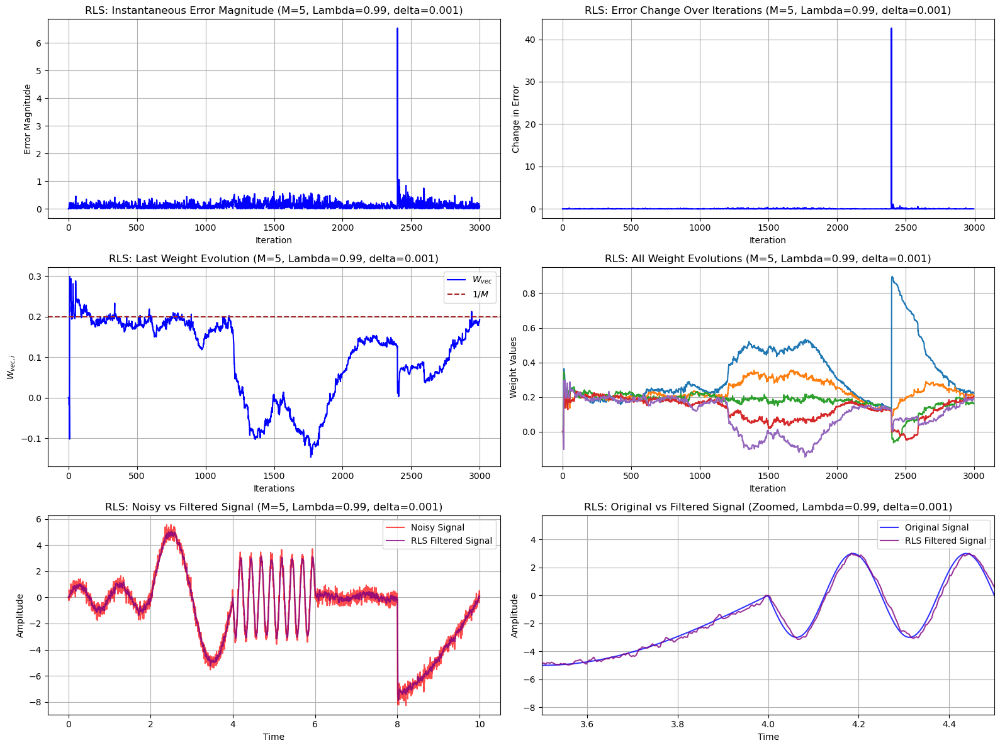

Running RLS with Lambda=0.99 and delta=1e-05


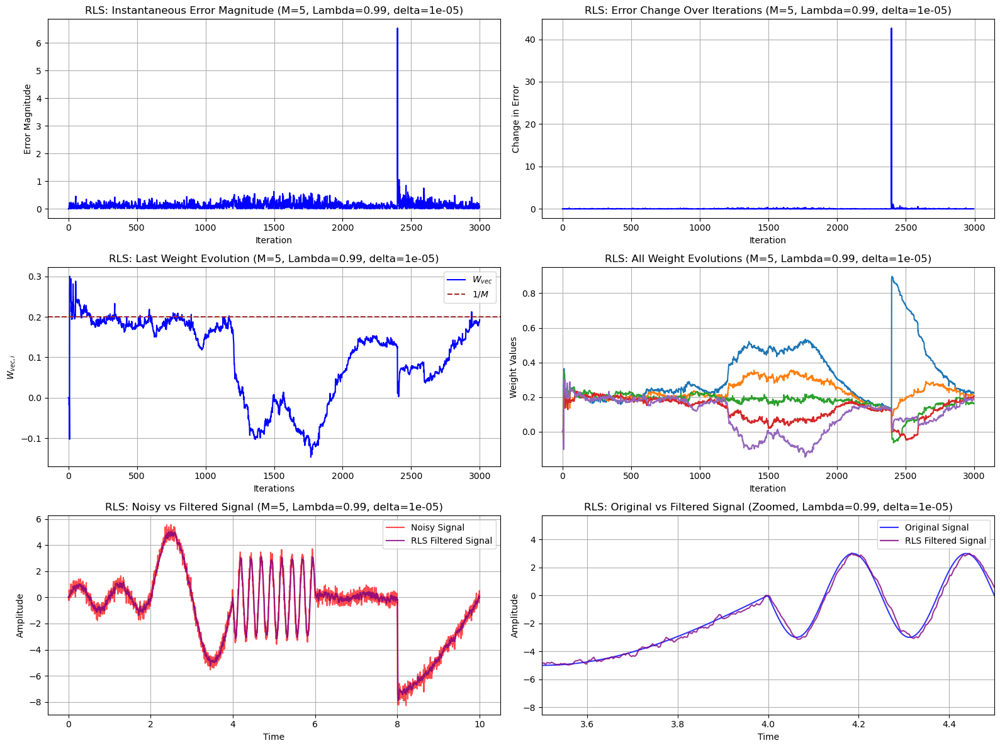

Running RLS with Lambda=0.99 and delta=1e-07


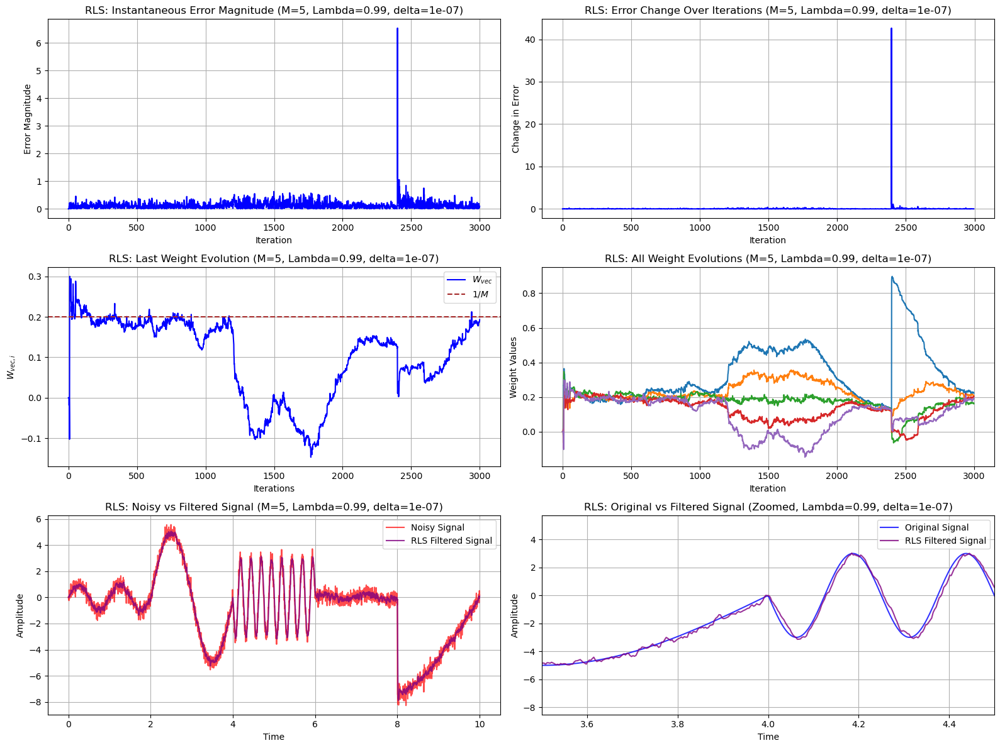

Running RLS with Lambda=0.9 and delta=0.001


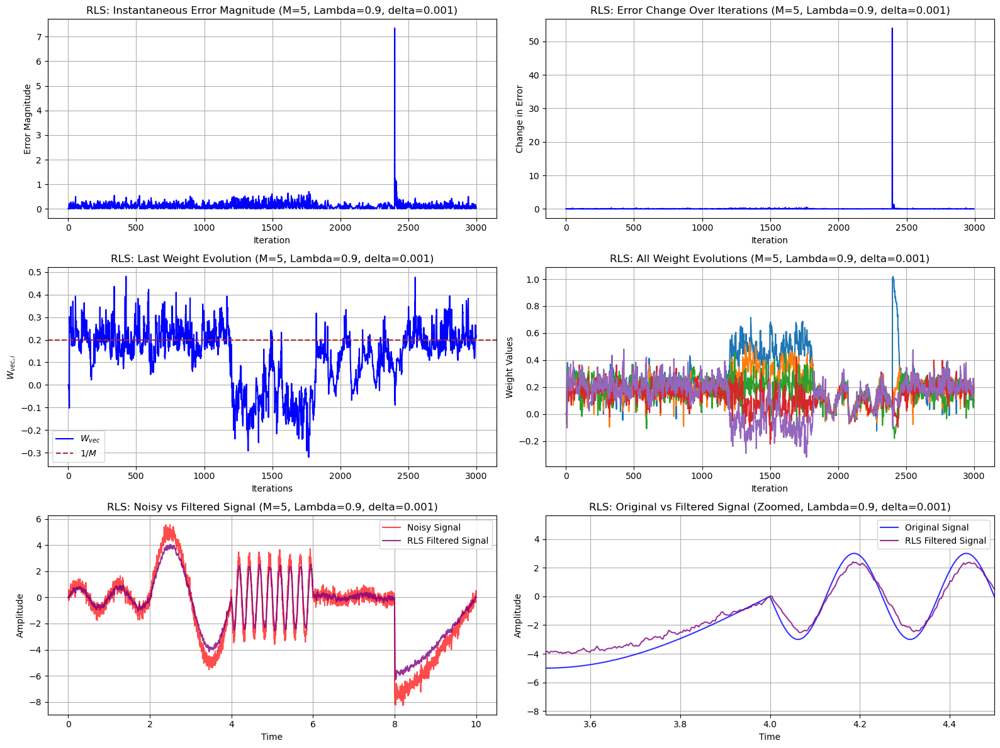

Running RLS with Lambda=0.9 and delta=1e-05


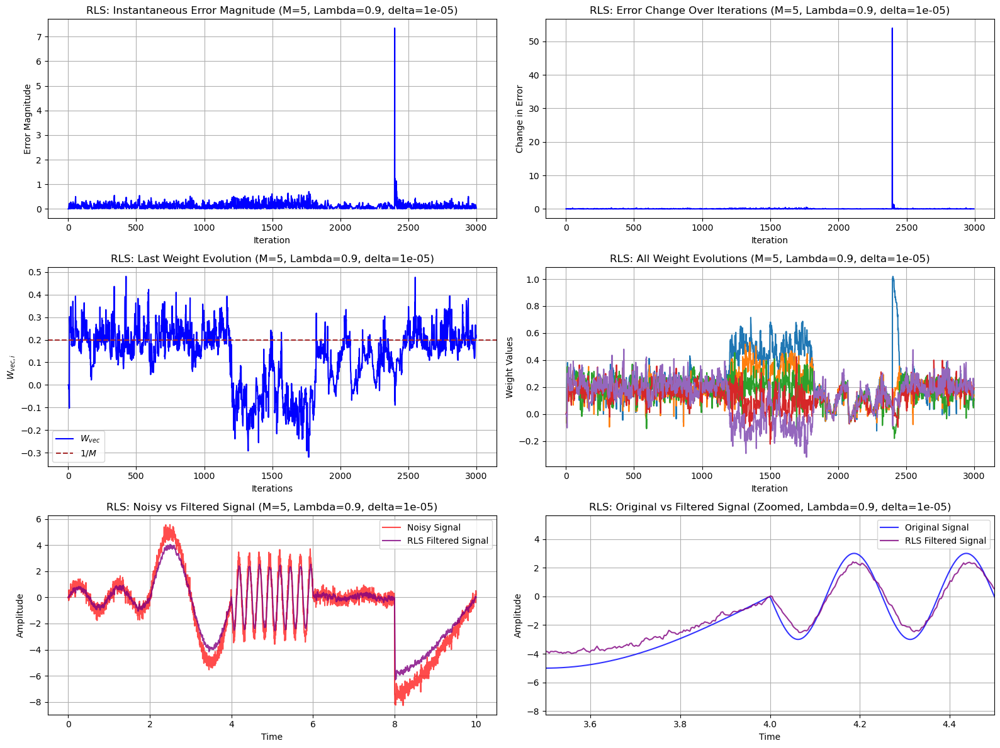

Running RLS with Lambda=0.9 and delta=1e-07


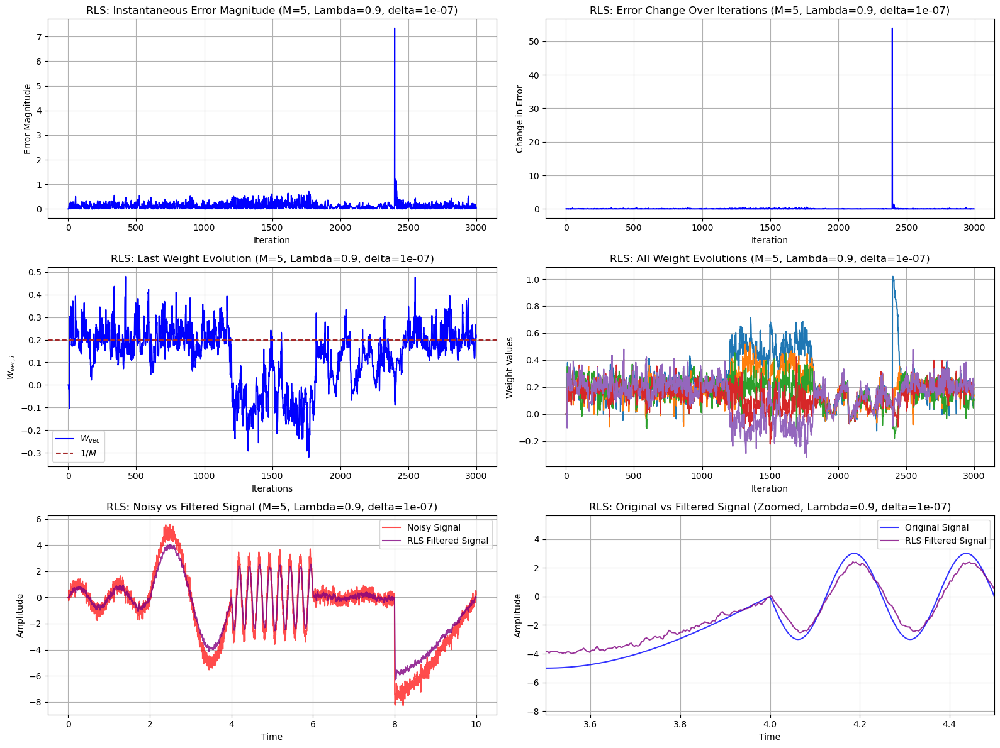

Running RLS with Lambda=0.85 and delta=0.001


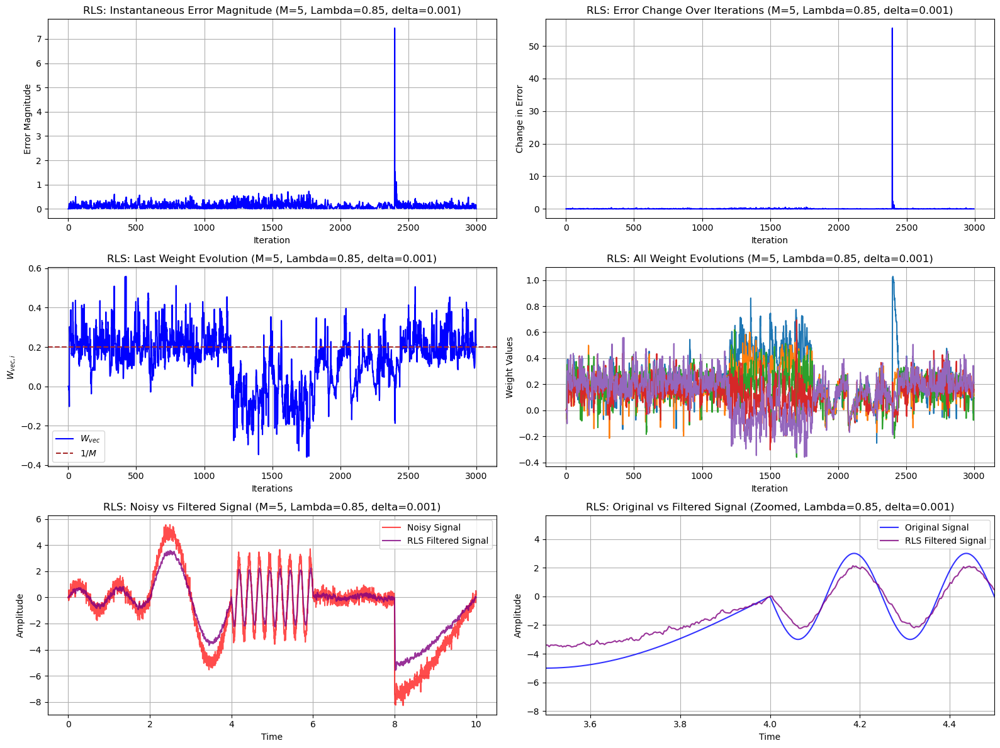

Running RLS with Lambda=0.85 and delta=1e-05


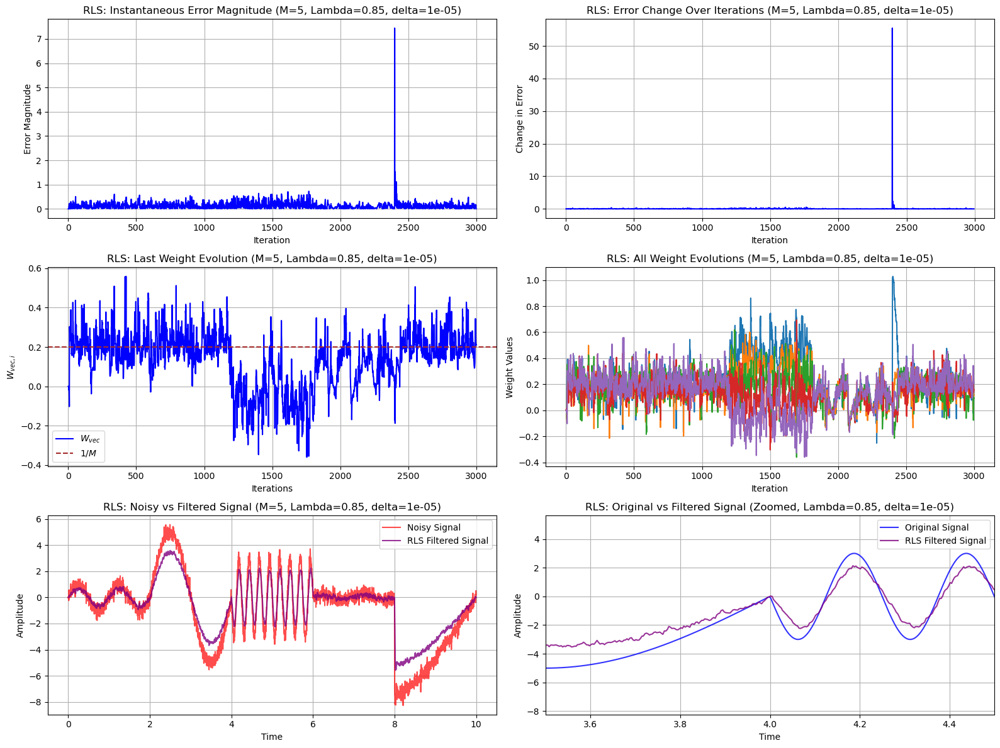

Running RLS with Lambda=0.85 and delta=1e-07


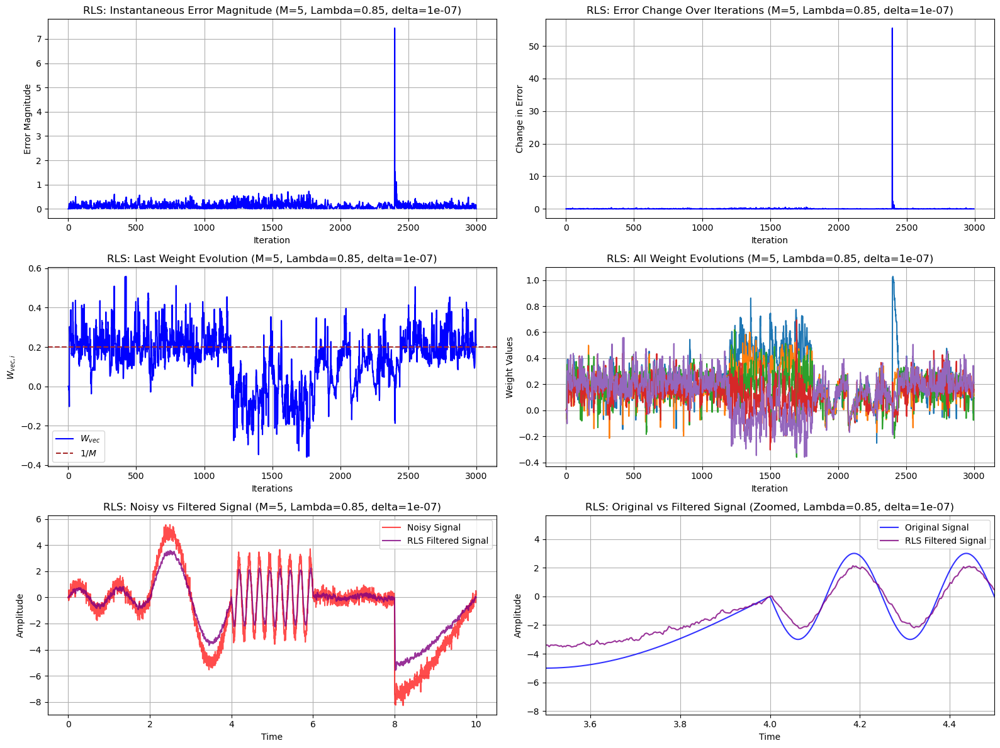

In [160]:
# time vector
t = np.linspace(0, 10, 3000)

# Generate a dynamic signal
signal = np.piecewise(
    t,
    [t < 2, (t >= 2) & (t < 4), (t >= 4) & (t < 6), (t >= 6) & (t < 8), t >= 8],
    [lambda t: np.sin(2 * np.pi * t),
     lambda t: 5 * np.sin(2 * np.pi * 0.5 * t),
     lambda t: -3 * np.sin(2 * np.pi * 4 * t),
     lambda t: 0.2 * np.sin(2 * np.pi * t),
     lambda t: 8 * np.sin(2 * np.pi * 0.1 * t)]
)

# Parameters
M = 5  # number of filter coefficients
noise_level = 0.3  # noise standard deviation
custom_noise = np.random.normal(0, noise_level, len(t))  # add Gaussian noise
noisy_signal = signal + custom_noise  # combine signal and noise

# Test different RLS hyperparameters
lambda_values = [0.99, 0.90, 0.85]  # different forgetting factors
delta_values = [1e-3, 1e-5, 1e-7]  # different regularization parameters

# Run RLS for each combination of hyperparameters
for Lambda in lambda_values:
    for delta in delta_values:
        print(f"Running RLS with Lambda={Lambda} and delta={delta}")
        
        # Run RLS
        w_RLS = np.zeros((len(noisy_signal), M))  # initialize weights
        newW_RLS, RLSErr, error_changes_RLS, _, _ = RLS(noisy_signal, signal, M, len(noisy_signal), Lambda, delta)
        
        # Filter the signal
        filtered_signal_RLS = np.zeros_like(noisy_signal)
        for i in range(M, len(noisy_signal)):
            filtered_signal_RLS[i] = np.dot(newW_RLS[-1, :], noisy_signal[i - M + 1: i + 1][::-1])
        
        # Plot results for the current hyperparameter combination
        plot_rls_results(
            t,
            signal,
            noisy_signal,
            filtered_signal_RLS,
            newW_RLS,
            RLSErr,
            error_changes_RLS,
            M,
            Lambda,
            delta
        )

# Analysis of RLS Hyperparameters ($\lambda$ and $\delta$)

### 1. Instantaneous Error Magnitudes
- **What We See**:
  - With smaller $\lambda$ (e.g., $0.85$), the error has more spikes and fluctuations.
  - Smaller $\delta$ (e.g., $1e-7$) increases noise in the error.
  - Larger $\lambda$ (e.g., $0.99$) and moderate $\delta$ (e.g., $1e-5$) make the error smoother and more stable.
- **Conclusion**:
  - Higher $\lambda$ and moderate $\delta$ give better control of the error.

### 2. Error Change Over Iterations
- **What We See**:
  - Lower $\lambda$ (e.g., $0.85$) causes more frequent and larger changes in the error.
  - For smaller $\delta$ (e.g., $1e-7$), the error changes are erratic.
  - Higher $\lambda$ (e.g., $0.99$) with larger $\delta$ leads to smoother error changes.
- **Conclusion**:
  - Smaller $\lambda$ and $\delta$ make error changes unstable, while higher values stabilize them.

### 3. Last Weight Evolution
- **What We See**:
  - For $\lambda = 0.85$, weights fluctuate heavily, especially with smaller $\delta$ (e.g., $1e-7$).
  - Higher $\lambda$ (e.g., $0.99$) and moderate $\delta$ (e.g., $1e-5$) result in smooth and stable weight evolution.
- **Conclusion**:
  - Stability improves with larger $\lambda$ and moderate $\delta$.

### 4. All Weight Evolutions
- **What We See**:
  - For $\lambda = 0.85$ and $\delta = 1e-7$, weights are highly unstable.
  - Higher $\lambda$ (e.g., $0.99$) and larger $\delta$ (e.g., $1e-5$) make weights more synchronized and stable.
- **Conclusion**:
  - Lower $\delta$ leads to instability, while higher $\lambda$ and $\delta$ stabilize the weights.


### 5. Denoised Signal Quality
- **What We See**:
  - For $\lambda = 0.85$ and $\delta = 1e-7$, the filtered signal has noise artifacts and poor alignment with the original signal.
  - Higher $\lambda$ (e.g., $0.99$) and moderate $\delta$ (e.g., $1e-5$) provide the cleanest and most accurate denoised signal.
- **Conclusion**:
  - Larger $\lambda$ and $\delta$ improve signal quality.


### Summary
1. **Effect of $\lambda$**:
   - Lower $\lambda$ adapts faster but is less stable.
   - Higher $\lambda$ (e.g., $0.99$) improves stability and signal quality.

2. **Effect of $\delta$**:
   - Smaller $\delta$ increases sensitivity but reduces stability.
   - Moderate $\delta$ (e.g., $1e-5$) ensures good performance.

3. **Best Parameters**:
   - $\lambda = 0.99$, $\delta = 1e-5$: Best balance between stability, error control, and denoising.

---

---

# Image Denoising Using LMS and RLS

In this part, I aim to reproduce an image with added noise, following the same approach used in **Assignment 2**. The exact same **flattening** and **unflattening** methods, as well as the **LMS** algorithm, will be used to process the data.

For denoising, I apply both **LMS** and **RLS** algorithms in parallel and plot the results side by side to observe the differences. After visualizing the results, I will analyze and discuss the observed differences between the two methods, focusing on the adaptability and efficiency of RLS compared to LMS.

In [201]:
def flatten_zigzag_diagonal(matrix):
    M, N = len(matrix), len(matrix[0])  # Get matrix dimensions
    result = []  # Initialize result list for 1D output

    for diag in range(M + N - 1):
        if diag % 2 == 0:
            # Traverse from bottom to top
            row = min(diag, M - 1)
            col = diag - row
            while row >= 0 and col < N:
                result.append(matrix[row][col])  # Append current element to result
                row -= 1
                col += 1
        else:
            # Traverse from top to bottom
            col = min(diag, N - 1)
            row = diag - col
            while col >= 0 and row < M:
                result.append(matrix[row][col])  # Append current element to result
                row += 1
                col -= 1

    return result  # Return the 1D zigzagged array

def unflatten_zigzag_diagonal(array, M, N):
    matrix = [[0] * N for _ in range(M)]  # Initialize MxN matrix
    index = 0  # Initialize index for array

    for diag in range(M + N - 1):
        if diag % 2 == 0:
            # Traverse from bottom to top
            row = min(diag, M - 1)
            col = diag - row
            while row >= 0 and col < N:
                matrix[row][col] = array[index]  # Place element in matrix
                index += 1
                row -= 1
                col += 1
        else:
            # Traverse from top to bottom
            col = min(diag, N - 1)
            row = diag - col
            while col >= 0 and row < M:
                matrix[row][col] = array[index]  # Place element in matrix
                index += 1
                row += 1
                col -= 1

    return matrix  # Return the reconstructed matrix

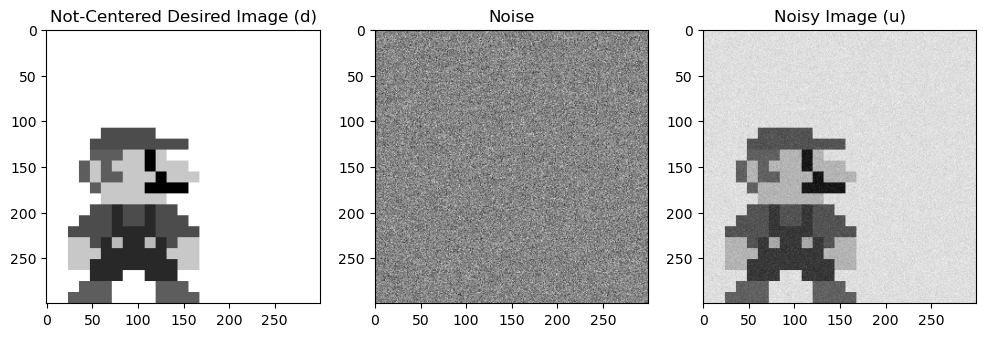

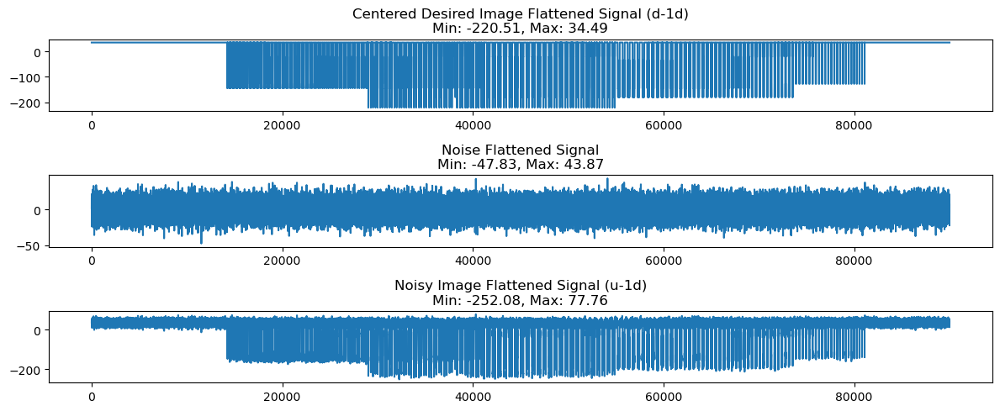

In [203]:
# Load and preprocess the image
image = cv.imread('Data/mario.png', cv.IMREAD_GRAYSCALE)  # load image in grayscale
image = cv.resize(image, (300, 300))  # resize to 300x300

# Generate centered image and add noise
d = image - np.mean(image)  # create centered desired image
noise_level = 10  # define noise level
noise = np.random.normal(0, noise_level, size=image.shape)  # generate Gaussian noise
u = d + noise  # add noise to the centered image to create the noisy image

# Visualize images
fig = plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(d + np.mean(image), cmap='gray')  # add mean back for visualization
plt.title('Not-Centered Desired Image (d)')

plt.subplot(1, 3, 2)
plt.imshow(noise, cmap='gray')  # plot noise
plt.title('Noise')

plt.subplot(1, 3, 3)
plt.imshow(u + np.mean(image), cmap='gray')  # add mean back for visualization
plt.title('Noisy Image (u)')

# Visualize 1D flattened signals with min/max in titles
fig = plt.figure(figsize=(12, 5))

plt.subplot(3, 1, 1)
plt.plot(flatten_zigzag_diagonal(d))  # flattened centered desired image
plt.title(f'Centered Desired Image Flattened Signal (d-1d)\nMin: {d.min():.2f}, Max: {d.max():.2f}')

plt.subplot(3, 1, 2)
plt.plot(flatten_zigzag_diagonal(noise))  # flattened noise signal
plt.title(f'Noise Flattened Signal\nMin: {noise.min():.2f}, Max: {noise.max():.2f}')

plt.subplot(3, 1, 3)
plt.plot(flatten_zigzag_diagonal(u))  # flattened noisy image
plt.title(f'Noisy Image Flattened Signal (u-1d)\nMin: {u.min():.2f}, Max: {u.max():.2f}')

plt.tight_layout()  # adjust layout for better visualization

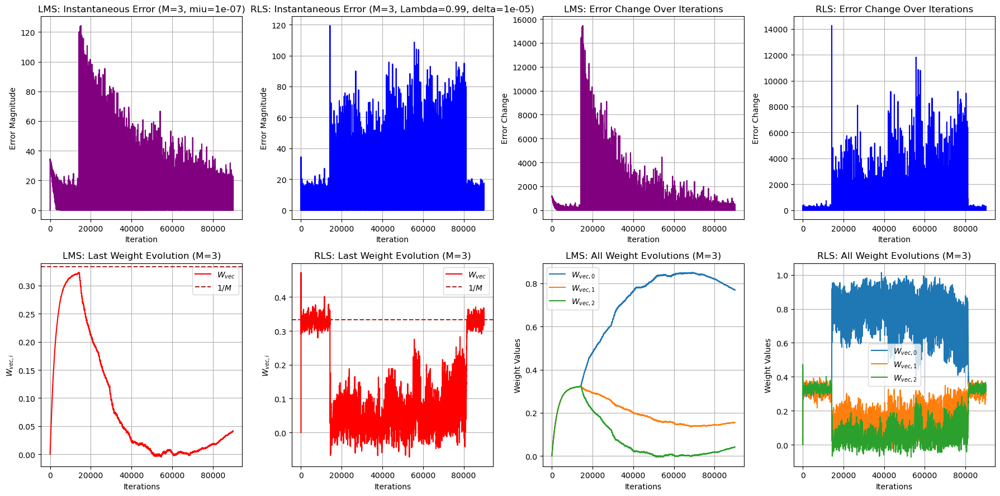

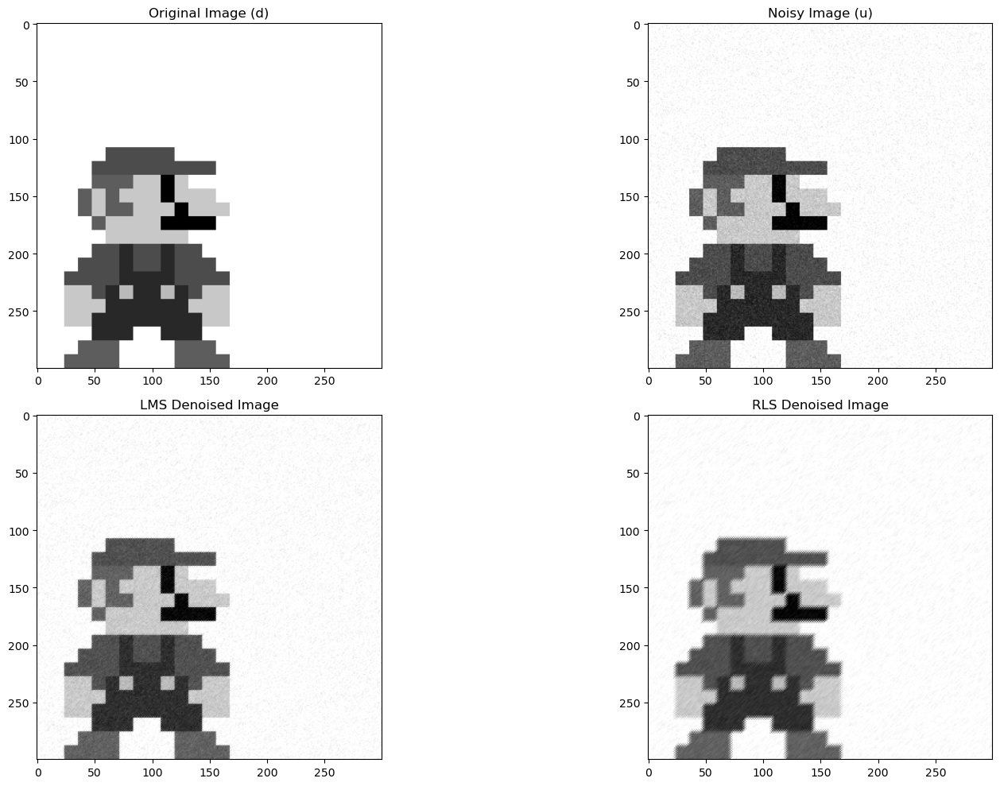

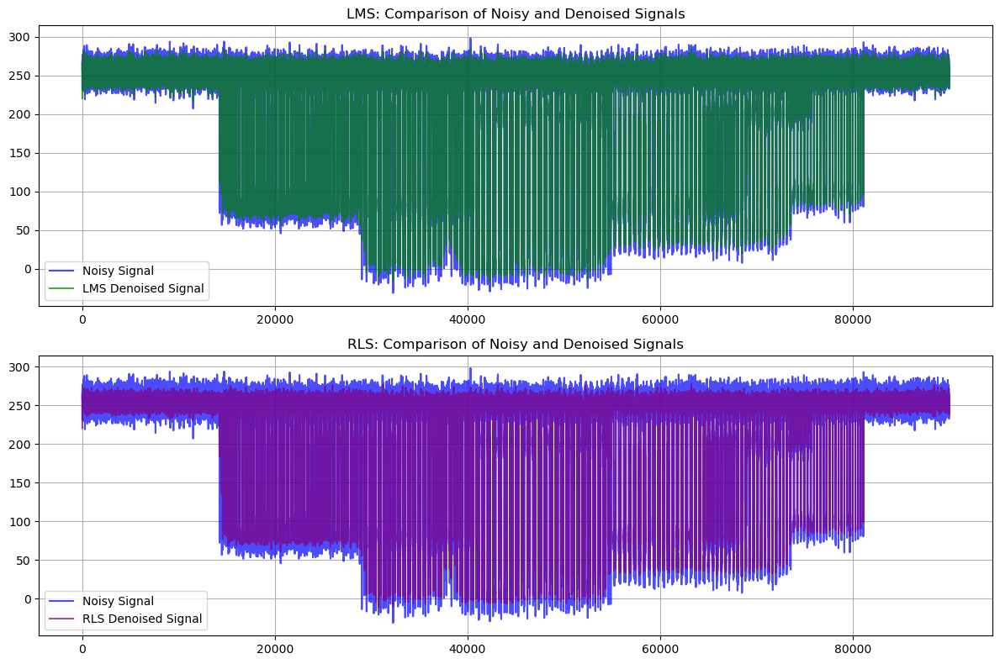

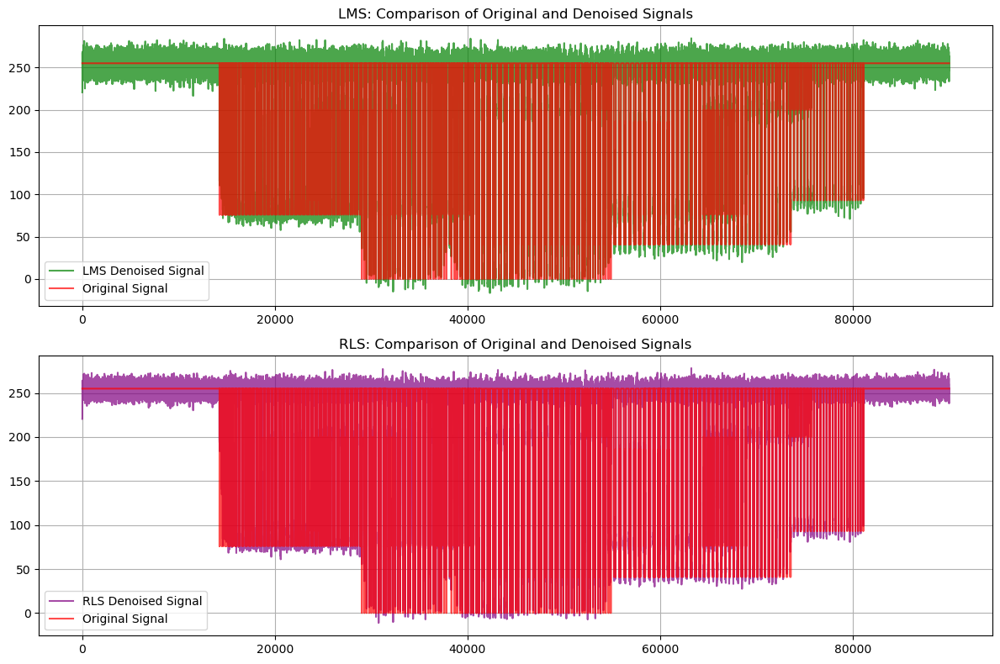

In [219]:
# Set parameters for LMS and RLS
M = 3  # Number of filter coefficients
miu_lms = 1e-7  # Step size for LMS
Lambda = 0.99  # Forgetting factor for RLS
delta = 1e-5  # Regularization parameter for RLS

# Flatten the noisy and desired signals
u_1d = np.array(flatten_zigzag_diagonal(u))  # Noisy signal
d_1d = np.array(flatten_zigzag_diagonal(d))  # Desired signal
totSamples = len(u_1d)  # Total samples

# Initialize weights for LMS and RLS
w_lms = np.zeros((totSamples, M))  # LMS weights
w_rls = np.zeros((totSamples, M))  # RLS weights

# Apply LMS algorithm
newW_lms, LMSErr, error_changes_lms = LMS(u_1d, d_1d, w_lms, M, totSamples, miu_lms)

# Apply RLS algorithm
newW_rls, RLSErr, error_changes_rls, _, _ = RLS(u_1d, d_1d, M, totSamples, Lambda, delta)

# Plot instantaneous error comparison
plt.figure(figsize=(18, 9))

# LMS: Instantaneous Error Magnitude
plt.subplot(2, 4, 1)
plt.plot(abs(LMSErr), color='purple')
plt.title(f"LMS: Instantaneous Error (M={M}, miu={miu_lms})")
plt.xlabel("Iteration")
plt.ylabel("Error Magnitude")
plt.grid(True)

# RLS: Instantaneous Error Magnitude
plt.subplot(2, 4, 2)
plt.plot(abs(RLSErr), color='blue')
plt.title(f"RLS: Instantaneous Error (M={M}, Lambda={Lambda}, delta={delta})")
plt.xlabel("Iteration")
plt.ylabel("Error Magnitude")
plt.grid(True)

# LMS: Error Change Over Iterations
plt.subplot(2, 4, 3)
plt.plot(error_changes_lms, color='purple')
plt.title("LMS: Error Change Over Iterations")
plt.xlabel("Iteration")
plt.ylabel("Error Change")
plt.grid(True)

# RLS: Error Change Over Iterations
plt.subplot(2, 4, 4)
plt.plot(error_changes_rls, color='blue')
plt.title("RLS: Error Change Over Iterations")
plt.xlabel("Iteration")
plt.ylabel("Error Change")
plt.grid(True)

# LMS: Last Weight Evolution
plt.subplot(2, 4, 5)
plt.plot(newW_lms[:, M - 1], color='red', label=r'$W_{vec}$')
plt.axhline(y=1/M, color='brown', linestyle='--', label=r'$1/M$')
plt.title(f"LMS: Last Weight Evolution (M={M})")
plt.xlabel("Iterations")
plt.ylabel(r"$W_{vec,i}$")
plt.legend()
plt.grid(True)

# RLS: Last Weight Evolution
plt.subplot(2, 4, 6)
plt.plot(newW_rls[:, M - 1], color='red', label=r'$W_{vec}$')
plt.axhline(y=1/M, color='brown', linestyle='--', label=r'$1/M$')
plt.title(f"RLS: Last Weight Evolution (M={M})")
plt.xlabel("Iterations")
plt.ylabel(r"$W_{vec,i}$")
plt.legend()
plt.grid(True)

# LMS: All Weight Evolutions
plt.subplot(2, 4, 7)
for i in range(M):
    plt.plot(newW_lms[:, i], label=fr'$W_{{vec,{i}}}$')
plt.title(f"LMS: All Weight Evolutions (M={M})")
plt.xlabel("Iterations")
plt.ylabel("Weight Values")
plt.legend()
plt.grid(True)

# RLS: All Weight Evolutions
plt.subplot(2, 4, 8)
for i in range(M):
    plt.plot(newW_rls[:, i], label=fr'$W_{{vec,{i}}}$')
plt.title(f"RLS: All Weight Evolutions (M={M})")
plt.xlabel("Iterations")
plt.ylabel("Weight Values")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Filter the noisy signal for LMS
filtered_image_lms = np.zeros_like(u_1d)
for i in range(M - 1, totSamples):
    filtered_image_lms[i] = np.dot(newW_lms[-1, :], u_1d[i - M + 1: i + 1][::-1])

# Filter the noisy signal for RLS
filtered_image_rls = np.zeros_like(u_1d)
for i in range(M - 1, totSamples):
    filtered_image_rls[i] = np.dot(newW_rls[-1, :], u_1d[i - M + 1: i + 1][::-1])

# Reshape filtered signals back to images
filtered_image_lms += np.mean(image)
filtered_image_rls += np.mean(image)
image_denoised_lms = unflatten_zigzag_diagonal(np.clip(filtered_image_lms, 0, 255), image.shape[0], image.shape[1])
image_denoised_rls = unflatten_zigzag_diagonal(np.clip(filtered_image_rls, 0, 255), image.shape[0], image.shape[1])

# Display images
plt.figure(figsize=(18, 10))

# Original and Noisy Images
plt.subplot(2, 2, 1)
plt.imshow(d, cmap='gray')
plt.title("Original Image (d)")

plt.subplot(2, 2, 2)
plt.imshow(np.clip(u + np.mean(image), 0, 255), cmap='gray')
plt.title("Noisy Image (u)")

# LMS Denoised Image
plt.subplot(2, 2, 3)
plt.imshow(image_denoised_lms, cmap='gray')
plt.title("LMS Denoised Image")

# RLS Denoised Image
plt.subplot(2, 2, 4)
plt.imshow(image_denoised_rls, cmap='gray')
plt.title("RLS Denoised Image")

plt.tight_layout()
plt.show()

# Signal comparisons for LMS and RLS
plt.figure(figsize=(12, 8))

# LMS: Comparison of Noisy and Denoised Signals
plt.subplot(2, 1, 1)
plt.plot(u_1d + np.mean(image), label="Noisy Signal", color='blue', alpha=0.7)
plt.plot(filtered_image_lms, label="LMS Denoised Signal", color='green', alpha=0.7)
plt.title("LMS: Comparison of Noisy and Denoised Signals")
plt.legend()
plt.grid(True)

# RLS: Comparison of Noisy and Denoised Signals
plt.subplot(2, 1, 2)
plt.plot(u_1d + np.mean(image), label="Noisy Signal", color='blue', alpha=0.7)
plt.plot(filtered_image_rls, label="RLS Denoised Signal", color='purple', alpha=0.7)
plt.title("RLS: Comparison of Noisy and Denoised Signals")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Original vs Denoised Signals
plt.figure(figsize=(12, 8))

# LMS: Comparison of Original and Denoised Signals
plt.subplot(2, 1, 1)
plt.plot(filtered_image_lms, label="LMS Denoised Signal", color='green', alpha=0.7)
plt.plot(d_1d + np.mean(image), label="Original Signal", color='red', alpha=0.7)
plt.title("LMS: Comparison of Original and Denoised Signals")
plt.legend()
plt.grid(True)

# RLS: Comparison of Original and Denoised Signals
plt.subplot(2, 1, 2)
plt.plot(filtered_image_rls, label="RLS Denoised Signal", color='purple', alpha=0.7)
plt.plot(d_1d + np.mean(image), label="Original Signal", color='red', alpha=0.7)
plt.title("RLS: Comparison of Original and Denoised Signals")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Analysis of LMS and RLS in Image Denoising

The analysis of the output highlights key differences between LMS and RLS in image denoising:

In the **signal denoising plots**, RLS and LMS demonstrate similar performance in terms of reducing error and achieving convergence. The instantaneous error and weight evolutions for both algorithms indicate steady learning, with RLS converging faster due to its adaptive weight update mechanism. However, this does not fully translate into superior image denoising quality for RLS when using only the **final weights** for reconstruction.

In the **image denoising results**, LMS produces a cleaner and visually better-denoised output compared to RLS. The RLS output exhibits residual noise and lacks the smoothness observed in the LMS-denoised image. This discrepancy arises because RLS's faster convergence focuses heavily on optimizing weights early in the process, which might not fully capture the image structure when relying solely on the final weights. LMS, although slower, maintains a more balanced approach that works well for the given noisy image.

A critical point is that the **use of final weights for denoising** is not always ideal, especially for RLS. While RLS converges quickly, it might miss finer details when used only with the final weights. In the next step, using **weights at each iteration** for denoising will likely improve RLS performance, as it better leverages its rapid adaptation throughout the process. This approach can better align with the desired behavior of adaptive filters, especially for image processing tasks.

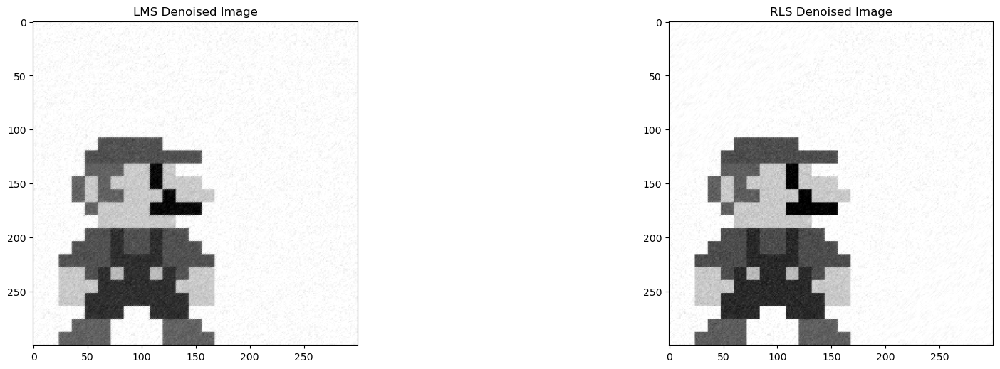

In [227]:
# Set parameters for LMS and RLS
M = 3  # Number of filter coefficients
miu_lms = 1e-7  # Step size for LMS
Lambda = 0.99  # Forgetting factor for RLS
delta = 1e-5  # Regularization parameter for RLS

# Flatten the noisy and desired signals
u_1d = np.array(flatten_zigzag_diagonal(u))  # Noisy signal
d_1d = np.array(flatten_zigzag_diagonal(d))  # Desired signal
totSamples = len(u_1d)  # Total samples

# Initialize weights for LMS and RLS
w_lms = np.zeros((totSamples, M))  # LMS weights
w_rls = np.zeros((totSamples, M))  # RLS weights

# Apply LMS algorithm
newW_lms, LMSErr, error_changes_lms = LMS(u_1d, d_1d, w_lms, M, totSamples, miu_lms)

# Apply RLS algorithm
newW_rls, RLSErr, error_changes_rls, _, _ = RLS(u_1d, d_1d, M, totSamples, Lambda, delta)


# Filter the noisy signal for LMS
filtered_image_lms = np.zeros_like(u_1d)
for i in range(M - 1, totSamples):
    filtered_image_lms[i] = np.dot(newW_lms[-1, :], u_1d[i - M + 1: i + 1][::-1])

# Filter the noisy signal for RLS
filtered_image_rls = np.zeros_like(u_1d)
for i in range(M - 1, totSamples):
    filtered_image_rls[i] = np.dot(newW_rls[i, :], u_1d[i - M + 1: i + 1][::-1])

# Reshape filtered signals back to images
filtered_image_lms += np.mean(image)
filtered_image_rls += np.mean(image)
image_denoised_lms = unflatten_zigzag_diagonal(np.clip(filtered_image_lms, 0, 255), image.shape[0], image.shape[1])
image_denoised_rls = unflatten_zigzag_diagonal(np.clip(filtered_image_rls, 0, 255), image.shape[0], image.shape[1])

# Display Denoised images
plt.figure(figsize=(18, 10))

# LMS Denoised Image
plt.subplot(2, 2, 3)
plt.imshow(image_denoised_lms, cmap='gray')
plt.title("LMS Denoised Image")

# RLS Denoised Image
plt.subplot(2, 2, 4)
plt.imshow(image_denoised_rls, cmap='gray')
plt.title("RLS Denoised Image")

plt.tight_layout()
plt.show()


Using `newW_rls[i, :]` instead of the last weight `newW_rls[-1, :]` in RLS is better because it adapts the filtering process at each step. RLS updates its weights quickly in every iteration, so using the current weight (`newW_rls[i, :]`) helps the filter respond to changes in the noisy signal. This makes the denoising process more accurate and improves the quality of the RLS denoised image compared to using just the final weight vector.

---

### Experiment: LMS and RLS on a Diagonal Gradient Image

In this experiment, we apply the LMS and RLS algorithms to denoise a diagonal gradient image where pixel values increase linearly in a zigzag pattern. Noise is added to simulate real-world conditions, and the performance of both algorithms is evaluated.

#### Steps of the Experiment:
1. **Gradient Image Creation**:
   - A 300x300 diagonal gradient image is generated with pixel values ranging from 0 to 255 in a zigzag pattern.
   - Noise with a standard deviation of 20 is added to simulate a noisy environment.

2. **Denoising with LMS**:
   - Parameters: $M=30$, $\mu=1 \times 10^{-9}$.

3. **Denoising with RLS**:
   - Parameters: $M=30$, $\lambda=0.99$, $\delta=1 \times 10^{-5}$.

4. **Comparison**:
   - The original, noisy, and denoised images are visually and numerically compared.
   - Metrics such as error reduction, weight evolution, and denoising performance are analyzed.

In [252]:
def lms_rls_over_file(file_path, noise_level, M, miu, Lambda, delta, W=0, use_another_w=False, output_print=False, RLS_function=False):
    image = cv.imread(file_path, cv.IMREAD_GRAYSCALE)  # load grayscale image
    image = cv.resize(image, (300, 300))  # resize to 300x300
    d = image - np.mean(image)  # create zero-mean desired image
    noise = np.random.normal(0, noise_level, size=image.shape)  # generate Gaussian noise
    u = d + noise  # create noisy image
    u_1d = np.array(flatten_zigzag_diagonal(u))  # flatten noisy image
    d_1d = np.array(flatten_zigzag_diagonal(d))  # flatten desired image
    totSamples = len(u_1d)  # total number of samples
    w = np.zeros((totSamples, M))  # initialize weights
    
    if RLS_function:
        newW, RLSErr, error_changes, _, _ = RLS(u_1d, d_1d, M, totSamples, Lambda, delta)  # apply RLS algorithm
    else:
        newW, LMSErr, error_changes = LMS(u_1d, d_1d, w, M, totSamples, miu)  # apply LMS algorithm
    
    if not use_another_w:
        W = newW[-1, :] if not RLS_function else newW
    
    # filter the noisy signal
    filtered_image_flattened = np.zeros_like(u_1d)
    for i in range(M - 1, totSamples):
        filtered_image_flattened[i] = np.dot(W if not RLS_function else newW[-1, :], u_1d[i - M + 1: i + 1][::-1])
    
    filtered_image_flattened += np.mean(image)  # restore mean
    filtered_image_flattened_clipped = np.clip(filtered_image_flattened, 0, 255)  # clip values
    image_denoised = unflatten_zigzag_diagonal(filtered_image_flattened_clipped, image.shape[0], image.shape[1])

    if output_print:  # if output visualization is required

        plt.figure(figsize=(14, 6))  # create a grid for error and weight plots

        if not use_another_w:
            # plot instantaneous error
            plt.subplot(2, 2, 1)
            plt.plot(abs(RLSErr if RLS_function else LMSErr), color='purple')
            plt.title(f"Instantaneous {'RLS' if RLS_function else 'LMS'} Error Per Iteration (M={M})")
            plt.xlabel("Iteration")
            plt.ylabel("Instantaneous Error Magnitude")
            plt.grid(True)
            
            # plot total error changes
            plt.subplot(2, 2, 2)
            plt.plot(error_changes, color='blue')
            plt.title("Error Change Over Iterations")
            plt.xlabel("Iteration")
            plt.ylabel("Change in Total Error")
            plt.grid(True)
        
        # plot weight evolution for the last weight
        plt.subplot(2, 2, 3)
        plt.plot(newW[:, M - 1] if not RLS_function else newW[:, -1], color='red', label=r'$W_{vec}$')
        plt.axhline(y=1/M, color='brown', linestyle='--', label=r'$1/M$')
        plt.title(f"Last Weight Evolution (M={M})")
        plt.xlabel("Iterations")
        plt.ylabel(r"$W_{vec,i}$")
        plt.grid(True)
        plt.legend()
        
        # plot all weight evolutions
        plt.subplot(2, 2, 4)
        for i in range(M):
            plt.plot(newW[:, i] if not RLS_function else newW[:, i])
        plt.title(f"All Weight Evolutions (M={M})")
        plt.xlabel("Iterations")
        plt.ylabel("Weight Values")
        plt.grid(True)
        
        plt.tight_layout()

        # display original, noisy, and denoised images
        plt.figure(figsize=(18, 6))
        
        plt.subplot(1, 3, 1)
        plt.imshow(d, cmap='gray')
        plt.title("Original Image (d)")
        
        plt.subplot(1, 3, 2)
        plt.imshow(np.clip(u + np.mean(image), 0, 255), cmap='gray')  # add mean to restore original intensity range and clip values for comparison
        plt.title("Noisy Image (Mean Added and Clipped) (u)")
        
        plt.subplot(1, 3, 3)
        plt.imshow(image_denoised, cmap='gray')
        plt.title("Denoised Image")
        
        plt.tight_layout()
        
        # compare noisy and denoised signals
        plt.figure(figsize=(12, 4))
        plt.plot(u_1d + np.mean(image), label="Noisy Signal (u-1d)", alpha=0.7, color='blue')
        plt.plot(filtered_image_flattened_clipped, label="Denoised Signal (Clipped)", alpha=0.7, color='green')
        plt.title("Comparison of Noisy and Denoised Signals")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        
        # compare original and denoised signals
        plt.figure(figsize=(12, 4))
        plt.plot(filtered_image_flattened_clipped, label="Denoised Signal (Clipped)", alpha=0.7, color='green')
        plt.plot(d_1d + np.mean(image), label="Original Signal (d-1d)", alpha=0.7, color='red')
        plt.title("Comparison of Original and Denoised Signals")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()

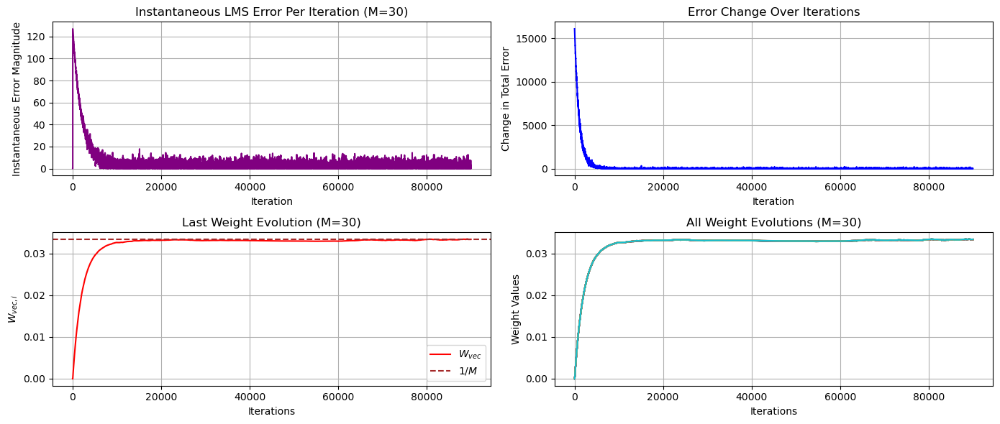

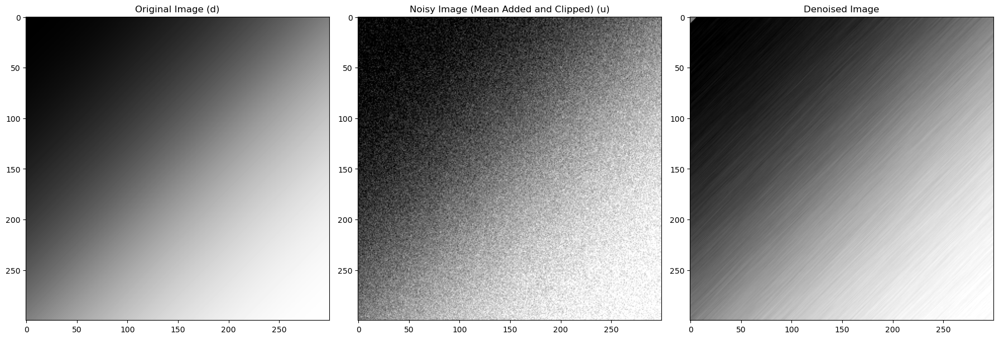

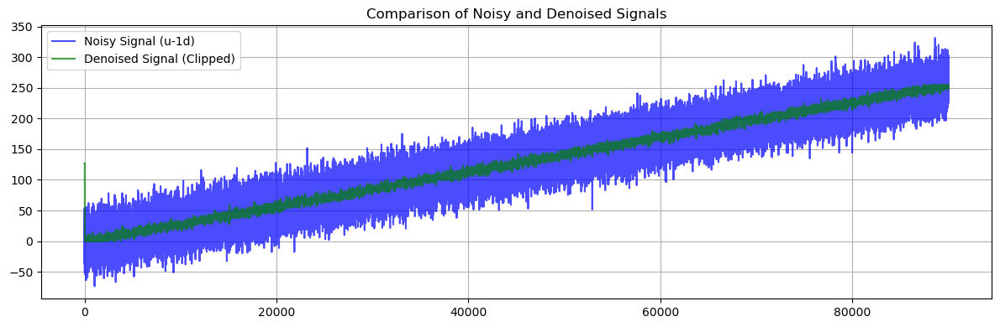

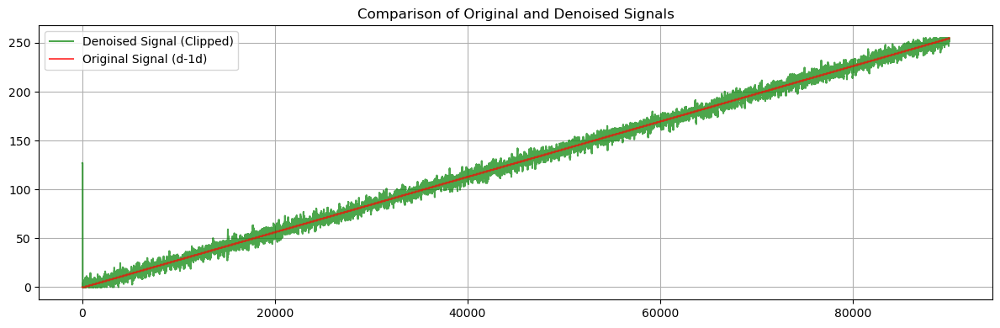

In [254]:
# Create a diagonal gradient image where pixel values increase linearly along the zigzag diagonal pattern
image = np.array(unflatten_zigzag_diagonal(np.linspace(0, 255, 90000, dtype=np.uint8), 300, 300))
cv.imwrite("Data/diagonal_gradient_image.png", image)

# Apply LMS or RLS denoising on the generated diagonal gradient image
lms_rls_over_file(
    file_path='Data/diagonal_gradient_image.png',
    noise_level=20,
    M=30,
    miu=1e-9,  # Step size for LMS
    Lambda=0.99,  # Forgetting factor for RLS
    delta=1e-5,  # Regularization parameter for RLS
    output_print=True,
    RLS_function=False  # Set to True for RLS, False for LMS
)

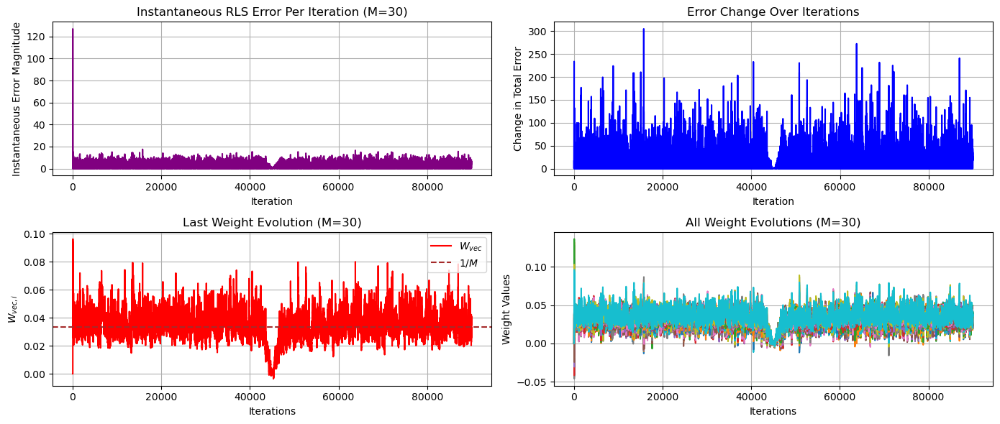

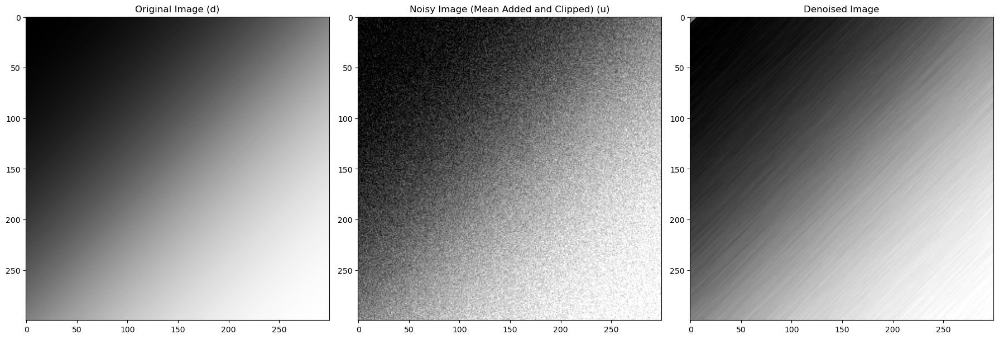

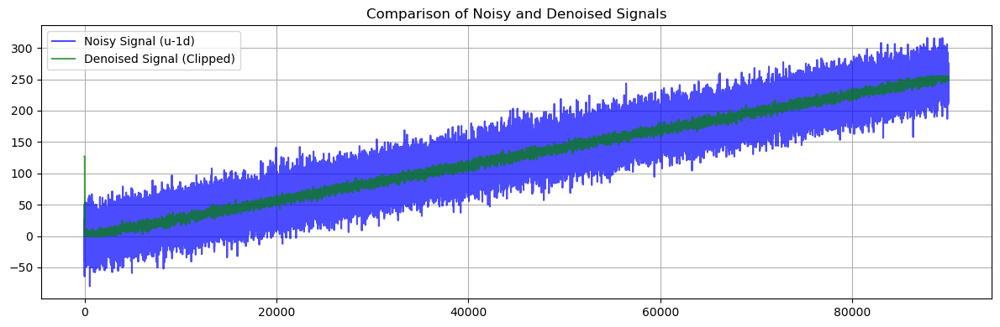

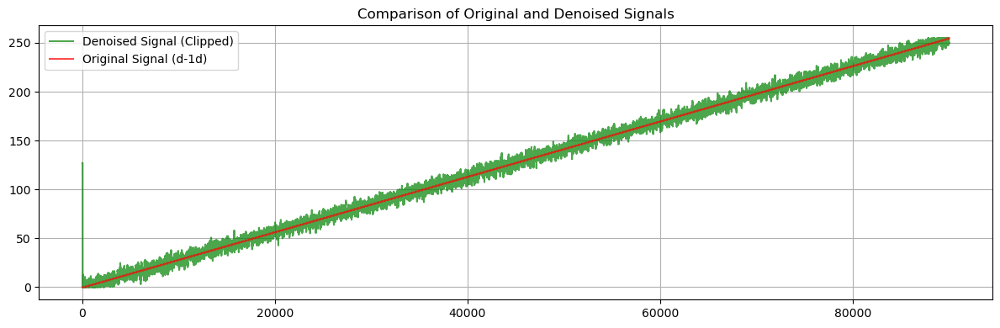

In [255]:
# Create a diagonal gradient image where pixel values increase linearly along the zigzag diagonal pattern
image = np.array(unflatten_zigzag_diagonal(np.linspace(0, 255, 90000, dtype=np.uint8), 300, 300))
cv.imwrite("Data/diagonal_gradient_image.png", image)

# Apply RLS denoising on the generated diagonal gradient image
lms_rls_over_file(
    file_path='Data/diagonal_gradient_image.png',
    noise_level=20,
    M=30,
    miu=1e-2,  # Step size for LMS (not used here for RLS)
    Lambda=0.99,  # Forgetting factor for RLS
    delta=1e-5,  # Regularization parameter for RLS
    output_print=True,
    RLS_function=True  # Set to True for RLS
)

### Analysis of RLS and LMS Results on Diagonal Gradient Image

The results from the experiments show the following:

1. **Speed of Convergence**:
   - **RLS**: RLS converges much faster than LMS. This is evident from the error plots, where RLS quickly reduces the error in fewer iterations.
   - **LMS**: LMS takes more time to converge. The error decreases slowly but steadily over iterations.

2. **Weight Behavior**:
   - **RLS**: The weights in RLS fluctuate even after convergence. This is because RLS dynamically adjusts weights for each input.
   - **LMS**: The weights in LMS stabilize smoothly without fluctuations. All weights align closely, resulting in overlapping curves.

3. **All Weight Evolutions**:
   - **RLS**: The weights do not align perfectly and adjust individually, showing that RLS optimizes each weight dynamically.
   - **LMS**: All weights converge to nearly the same value, causing their curves to overlap.

4. **Denoising Performance**:
   - Both RLS and LMS effectively remove noise from the diagonal gradient image. The final denoised images look clear, with minimal noise.
   - The filtered signals also demonstrate good noise reduction for both algorithms. However, RLS achieves this in fewer iterations due to its faster convergence.

### Conclusion:
RLS converges faster and adapts dynamically to changes, while LMS is slower but more stable. Both algorithms produce effective denoising results.

---

---

### Optional Extra
# Experiment: Reproducing Results from Chapter 6.7 with LMS and RLS

In this experiment, we repeated the results from **Chapter 6.7** using both **LMS** and **RLS** algorithms. The parameters for the AR(1) process and algorithms were the same as in the original assignment. For RLS, we used a forgetting factor $\lambda = 0.99$ and a regularization parameter $\delta = 0.001$ for stability.

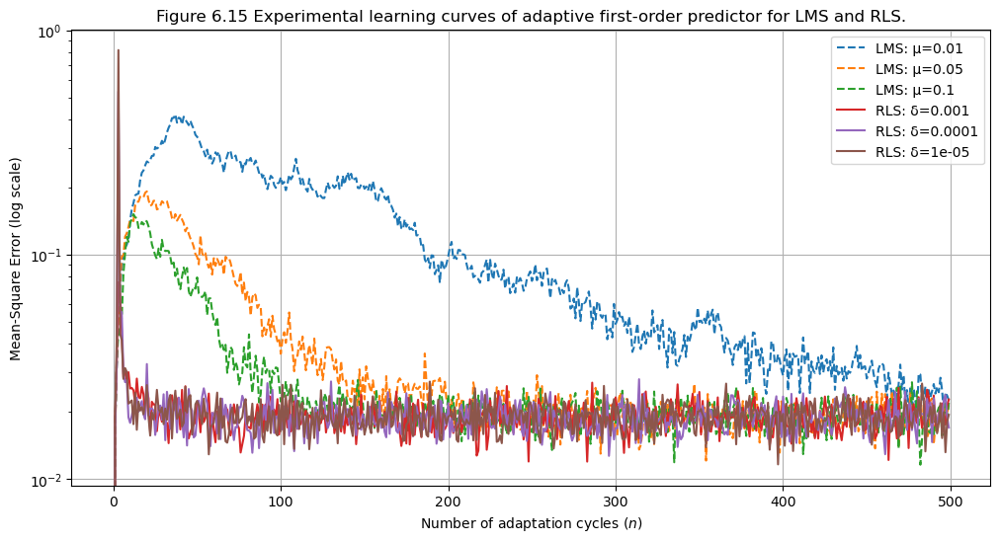

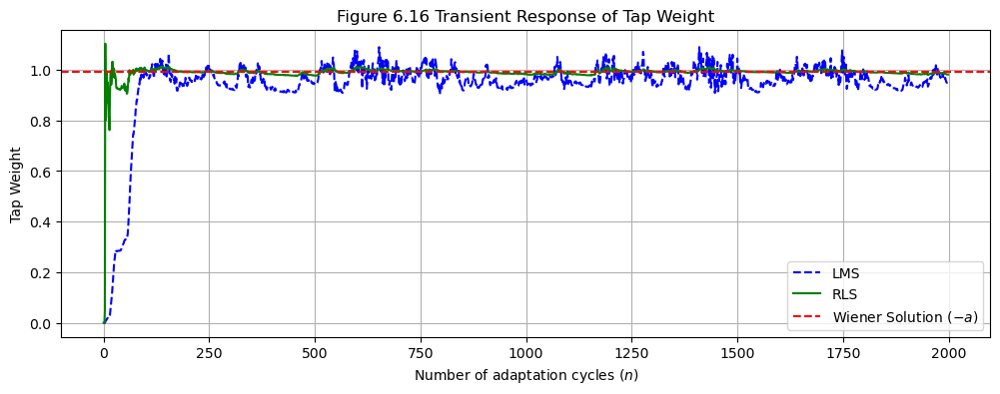

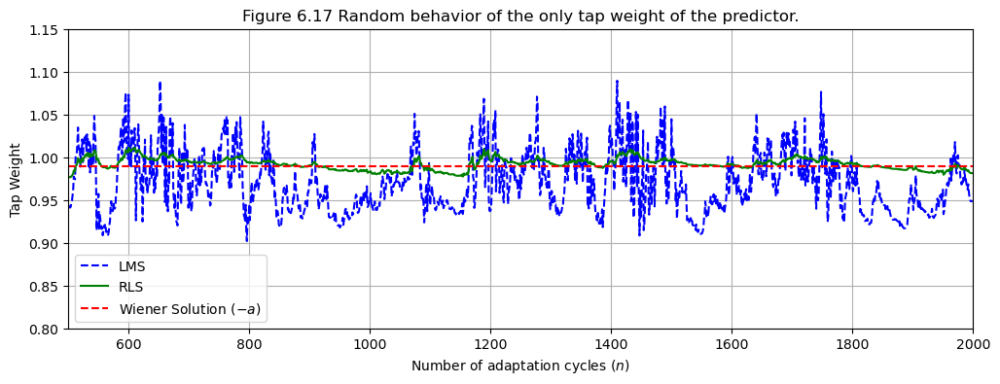

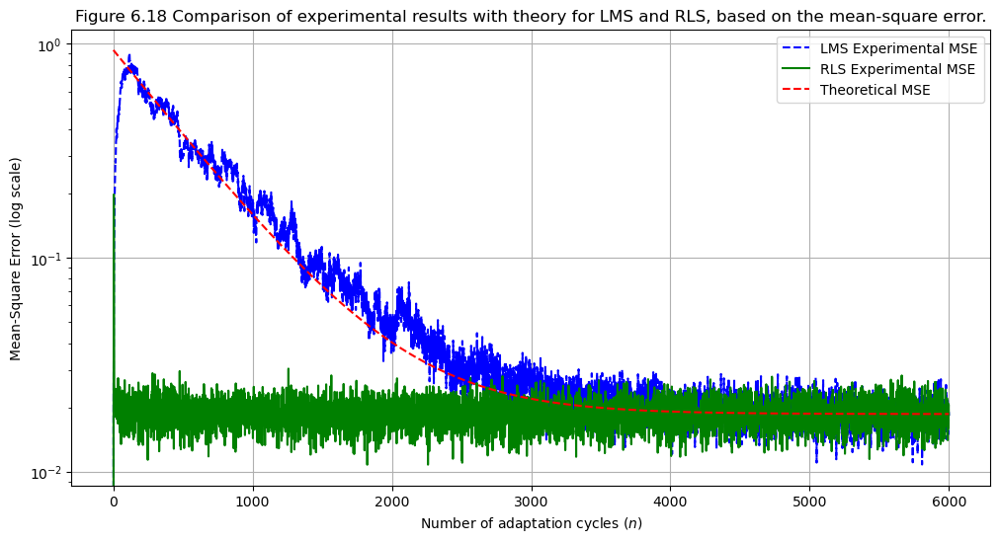

In [264]:
# Generate AR(1) process
def generate_ar_process(a, sigma_v2, num_samples):
    u = np.zeros(num_samples)
    v = np.random.normal(0, np.sqrt(sigma_v2), num_samples)
    for n in range(1, num_samples):
        u[n] = -a * u[n - 1] + v[n]
    return u

# LMS algorithm
def lms_for_prediction(u, miu, num_samples):
    w = np.zeros(num_samples + 1)
    f = np.zeros(num_samples)
    for n in range(1, num_samples):
        f[n] = u[n] - w[n] * u[n - 1]
        w[n + 1] = w[n] + miu * f[n] * u[n - 1]
    return w[1:], f

# RLS algorithm
def rls_for_prediction(u, Lambda, delta, num_samples):
    w = np.zeros(num_samples + 1)
    f = np.zeros(num_samples)
    P = np.ones(num_samples + 1) / delta  # Initialize the inverse correlation matrix
    for n in range(1, num_samples):
        k = P[n] * u[n - 1] / (Lambda + P[n] * u[n - 1]**2)
        f[n] = u[n] - w[n] * u[n - 1]
        w[n + 1] = w[n] + k * f[n]
        P[n + 1] = (P[n] - k * P[n] * u[n - 1]) / Lambda
    return w[1:], f

# Monte Carlo simulation
def MC_simulation(algorithm, param_values, a, sigma_v2, num_samples, num_runs, delta=None, Lambda=None):
    mse_curves = {}
    weight_curves = {}
    for param in param_values:
        mse_per_run = np.zeros((num_runs, num_samples))
        weight_per_run = np.zeros((num_runs, num_samples))
        for run in range(num_runs):
            u = generate_ar_process(a, sigma_v2, num_samples)
            if algorithm == "LMS":
                w, f = lms_for_prediction(u, param, num_samples)
            elif algorithm == "RLS":
                w, f = rls_for_prediction(u, Lambda, param, num_samples)
            mse_per_run[run] = f**2
            weight_per_run[run] = w
        mse_curves[param] = np.mean(mse_per_run, axis=0)
        weight_curves[param] = np.mean(weight_per_run, axis=0)
    return mse_curves, weight_curves

# Theoretical MSE for LMS
def theoretical_J(a, sigma_v2, miu, sigma_u2, num_samples):
    J = np.zeros(num_samples)
    for n in range(num_samples):
        steady_term = sigma_v2 * (1 + (miu / 2) * sigma_u2)
        transient_term = sigma_u2 * (a**2 - (miu / 2) * sigma_v2)
        exp_decay = (1 - miu * sigma_u2)**(2 * n)
        J[n] = steady_term + transient_term * exp_decay
    return J

# Parameters
a = -0.99
sigma_u2 = 0.936
sigma_v2 = sigma_u2 * (1 - a**2)
miu_values = [0.01, 0.05, 0.1]
delta_values = [0.001, 0.0001, 0.00001]
num_samples = 500
num_runs = 100
Lambda = 0.99

# LMS Monte Carlo simulation
mse_curves_lms, weight_curves_lms = MC_simulation("LMS", miu_values, a, sigma_v2, num_samples, num_runs)

# RLS Monte Carlo simulation
mse_curves_rls, weight_curves_rls = MC_simulation("RLS", delta_values, a, sigma_v2, num_samples, num_runs, delta=delta_values, Lambda=Lambda)

# Plot Learning Curves (Figure 6.15)
plt.figure(figsize=(12, 6))
for miu in miu_values:
    plt.plot(mse_curves_lms[miu], label=f"LMS: μ={miu}", linestyle="--")
for delta in delta_values:
    plt.plot(mse_curves_rls[delta], label=f"RLS: δ={delta}", linestyle="-")
plt.yscale("log")
plt.title(r"Figure 6.15 Experimental learning curves of adaptive first-order predictor for LMS and RLS.")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Mean-Square Error (log scale)")
plt.grid()
plt.legend()
plt.show()

# Transient Response of Tap Weight (Figure 6.16)
u = generate_ar_process(a, sigma_v2, 2000)
w_history_lms, _ = lms_for_prediction(u, 0.1, 2000)
w_history_rls, _ = rls_for_prediction(u, Lambda, 0.001, 2000)

plt.figure(figsize=(12, 4))
plt.plot(w_history_lms, label="LMS", linestyle="--", color="blue")
plt.plot(w_history_rls, label="RLS", linestyle="-", color="green")
plt.axhline(-a, color="red", linestyle="--", label="Wiener Solution ($-a$)")
plt.title("Figure 6.16 Transient Response of Tap Weight")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Tap Weight")
plt.grid()
plt.legend()
plt.show()

# Random Behavior of Tap Weight (Figure 6.17)
plt.figure(figsize=(12, 4))
plt.plot(w_history_lms, label="LMS", linestyle="--", color="blue")
plt.plot(w_history_rls, label="RLS", linestyle="-", color="green")
plt.axhline(-a, color="red", linestyle="--", label="Wiener Solution ($-a$)")
plt.xlim(500, 2000)
plt.ylim(0.8, 1.15)
plt.title("Figure 6.17 Random behavior of the only tap weight of the predictor.")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Tap Weight")
plt.grid()
plt.legend()
plt.show()

# Theoretical vs Experimental MSE (Figure 6.18)
miu = 0.001
num_samples = 6000
theoretical_J_curve = theoretical_J(a, sigma_v2, miu, sigma_u2, num_samples)
mse_experiment_lms, _ = MC_simulation("LMS", [miu], a, sigma_v2, num_samples, num_runs)
mse_experiment_rls, _ = MC_simulation("RLS", [delta_values[0]], a, sigma_v2, num_samples, num_runs, delta=delta_values, Lambda=Lambda)

plt.figure(figsize=(12, 6))
plt.plot(mse_experiment_lms[miu], label="LMS Experimental MSE", linestyle="--", color="blue")
plt.plot(mse_experiment_rls[delta_values[0]], label="RLS Experimental MSE", linestyle="-", color="green")
plt.plot(theoretical_J_curve, label="Theoretical MSE", linestyle="--", color="red")
plt.yscale("log")
plt.title(r"Figure 6.18 Comparison of experimental results with theory for LMS and RLS, based on the mean-square error.")
plt.xlabel("Number of adaptation cycles ($n$)")
plt.ylabel("Mean-Square Error (log scale)")
plt.grid()
plt.legend()
plt.show()

### Analysis of Figures 6.15 to 6.18

#### Figure 6.15: Experimental Learning Curves
This plot shows how LMS and RLS reduce the error over time with different parameters. Key observations:
- **LMS** takes more time to converge compared to RLS. Larger step sizes ($\mu = 0.01, 0.05, 0.1$ for LMS) make it faster but can cause instability.
- **RLS** adapts much faster due to its advanced recursive updates. It performs better across all tested parameters ($\delta = 0.001, 0.0001, 1 \times 10^{-5}$).
- RLS is less sensitive to parameter changes than LMS, making it more reliable in different situations.

#### Figure 6.16: Transient Response of Tap Weight
This plot compares how quickly the weights in LMS and RLS reach the correct value ($-a = 0.99$):
- **RLS** reaches the correct value very quickly and stays stable with only small changes.
- **LMS** takes longer to reach the correct value. Larger step sizes help it converge faster but can make it unstable.
- RLS is better for tasks where fast and accurate adjustments are needed.

#### Figure 6.17: Random Behavior of Tap Weight
This plot shows how the weights behave after convergence:
- **LMS** weights fluctuate more around the correct value, especially with larger step sizes.
- **RLS** weights are much more stable, showing smaller changes over time.
- RLS's stability makes it more reliable for long-term tasks that require steady performance.

#### Figure 6.18: Theoretical vs. Experimental MSE
This plot compares the theoretical MSE curve with the experimental results for LMS and RLS:
- The **LMS experimental MSE** matches the theoretical MSE curve closely. This confirms the theory for LMS.
- **RLS does not match the theoretical curve** because the theory is made for LMS only. RLS has a different way of working, which is not described by the LMS theory.
- Even so, **RLS achieves lower error levels** in the steady state, showing that it is better at reducing error than LMS.

#### Overall Analysis
RLS performs better than LMS in every way: it adapts faster, has more stable weights, and reduces the error more effectively. LMS results match its theory, but the RLS results show its unique advantages. RLS is a better choice for tasks where speed, stability, and low error are important.

---
---

# Experiment: Reproducing Results from Chapter 6.7 with NLMS and RLS

In this experiment, we reproduced the results from **Chapter 6.7**, comparing **normalized LMS (NLMS)** and **recursive least squares (RLS)** algorithms. The parameters for the AR(1) process and algorithms were kept consistent with the original assignment.

- For **NLMS**, a normalization factor $\epsilon = 0.01$ was used for stability.
- For **RLS**, the forgetting factors ($\lambda$) were varied to observe their impact on performance, with $\delta = 10^{-3}$ as the regularization parameter.

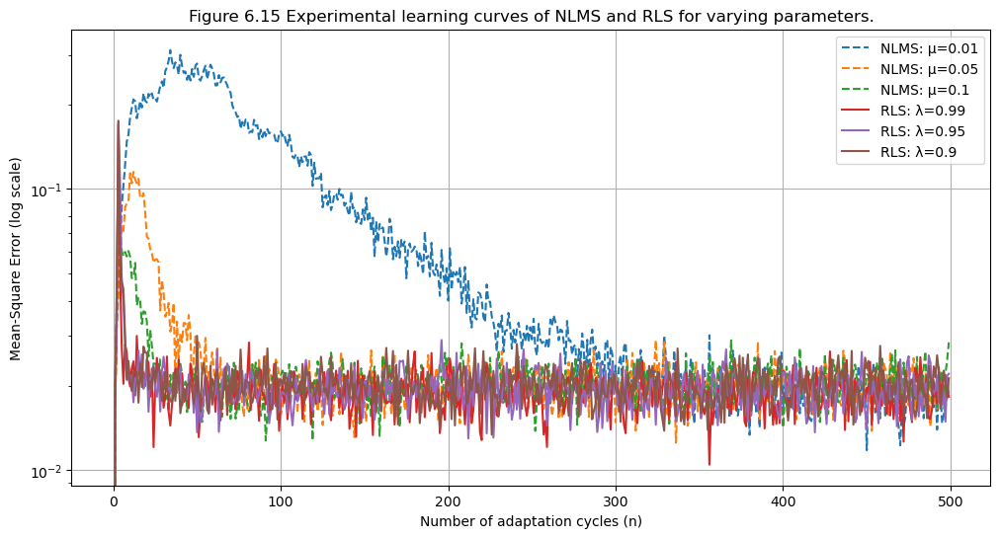

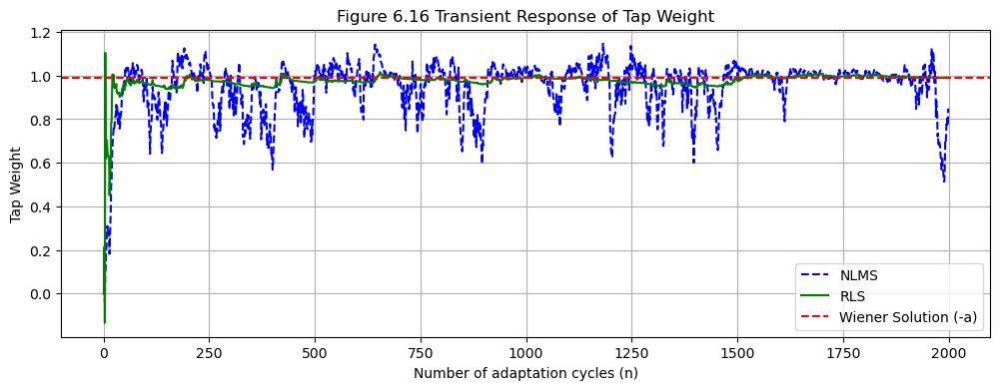

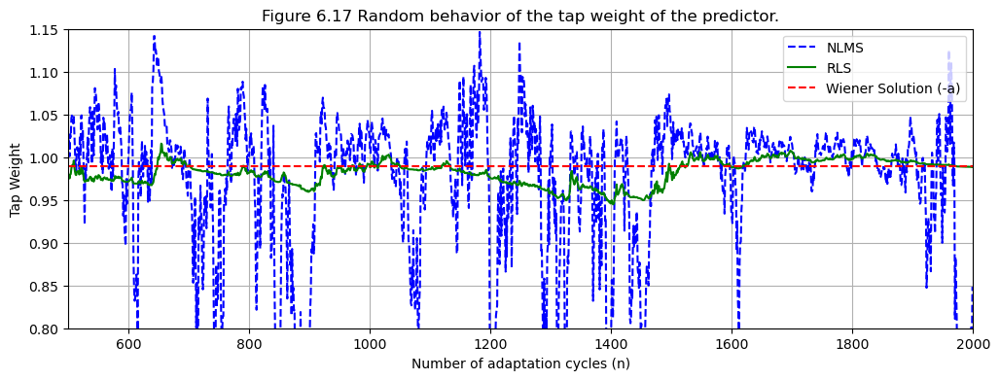

In [270]:
# Generate AR(1) process
def generate_ar_process(a, sigma_v2, num_samples):
    u = np.zeros(num_samples)
    v = np.random.normal(0, np.sqrt(sigma_v2), num_samples)
    for n in range(1, num_samples):
        u[n] = -a * u[n - 1] + v[n]
    return u

# NLMS algorithm
def nlms_for_prediction(u, miu, epsilon, num_samples):
    w = np.zeros(num_samples + 1)
    f = np.zeros(num_samples)
    for n in range(1, num_samples):
        norm_factor = u[n - 1]**2 + epsilon
        f[n] = u[n] - w[n] * u[n - 1]
        w[n + 1] = w[n] + (miu / norm_factor) * f[n] * u[n - 1]
    return w[1:], f

# RLS algorithm
def rls_for_prediction(u, delta, Lambda, num_samples):
    w = np.zeros(num_samples + 1)
    f = np.zeros(num_samples)
    P = np.ones(num_samples + 1) * (1 / delta)  # Initialize inverse correlation matrix (scalar for AR(1))
    for n in range(1, num_samples):
        k = P[n] * u[n - 1] / (Lambda + P[n] * u[n - 1]**2)  # Gain
        f[n] = u[n] - w[n] * u[n - 1]
        w[n + 1] = w[n] + k * f[n]
        P[n + 1] = (P[n] - k * P[n] * u[n - 1]) / Lambda  # Update inverse correlation
    return w[1:], f

# Monte Carlo simulation
def MC_simulation(algorithm, params, a, sigma_v2, num_samples, num_runs, epsilon=None, Lambda=None, delta=None):
    mse_curves = {}
    weight_curves = {}
    for param in params:
        mse_per_run = np.zeros((num_runs, num_samples))
        weight_per_run = np.zeros((num_runs, num_samples))
        for run in range(num_runs):
            u = generate_ar_process(a, sigma_v2, num_samples)
            if algorithm == "NLMS":
                w, f = nlms_for_prediction(u, param, epsilon, num_samples)
            elif algorithm == "RLS":
                w, f = rls_for_prediction(u, delta, param, num_samples)
            mse_per_run[run] = f**2
            weight_per_run[run] = w
        mse_curves[param] = np.mean(mse_per_run, axis=0)
        weight_curves[param] = np.mean(weight_per_run, axis=0)
    return mse_curves, weight_curves

# Parameters
a = -0.99
sigma_u2 = 0.936
sigma_v2 = sigma_u2 * (1 - a**2)
num_samples = 500
num_runs = 100
epsilon = 0.01
Lambda_values = [0.99, 0.95, 0.9]  # Forgetting factors for RLS
delta = 1e-3  # Regularization parameter for RLS
miu_values = [0.01, 0.05, 0.1]  # Step sizes for NLMS

# NLMS Monte Carlo simulation
mse_curves_nlms, weight_curves_nlms = MC_simulation("NLMS", miu_values, a, sigma_v2, num_samples, num_runs, epsilon=epsilon)

# RLS Monte Carlo simulation
mse_curves_rls, weight_curves_rls = MC_simulation("RLS", Lambda_values, a, sigma_v2, num_samples, num_runs, delta=delta)

# Plot Learning Curves (Figure 6.15)
plt.figure(figsize=(12, 6))
for miu in miu_values:
    plt.plot(mse_curves_nlms[miu], label=f"NLMS: μ={miu}", linestyle="--")
for Lambda in Lambda_values:
    plt.plot(mse_curves_rls[Lambda], label=f"RLS: λ={Lambda}", linestyle="-")
plt.yscale("log")
plt.title("Figure 6.15 Experimental learning curves of NLMS and RLS for varying parameters.")
plt.xlabel("Number of adaptation cycles (n)")
plt.ylabel("Mean-Square Error (log scale)")
plt.grid()
plt.legend()
plt.show()

# Transient Response of Tap Weight (Figure 6.16)
u = generate_ar_process(a, sigma_v2, 2000)
w_history_nlms, _ = nlms_for_prediction(u, 0.1, epsilon, 2000)
w_history_rls, _ = rls_for_prediction(u, delta, 0.99, 2000)

plt.figure(figsize=(12, 4))
plt.plot(w_history_nlms, label="NLMS", linestyle="--", color="blue")
plt.plot(w_history_rls, label="RLS", linestyle="-", color="green")
plt.axhline(-a, color="red", linestyle="--", label="Wiener Solution (-a)")
plt.title("Figure 6.16 Transient Response of Tap Weight")
plt.xlabel("Number of adaptation cycles (n)")
plt.ylabel("Tap Weight")
plt.grid()
plt.legend()
plt.show()

# Random Behavior of Tap Weight (Figure 6.17)
plt.figure(figsize=(12, 4))
plt.plot(w_history_nlms, label="NLMS", linestyle="--", color="blue")
plt.plot(w_history_rls, label="RLS", linestyle="-", color="green")
plt.axhline(-a, color="red", linestyle="--", label="Wiener Solution (-a)")
plt.xlim(500, 2000)
plt.ylim(0.8, 1.15)
plt.title("Figure 6.17 Random behavior of the tap weight of the predictor.")
plt.xlabel("Number of adaptation cycles (n)")
plt.ylabel("Tap Weight")
plt.grid()
plt.legend()
plt.show()

### Analysis of NLMS and RLS Outputs

The following analysis provides insights into the performance of NLMS and RLS algorithms based on the generated plots.

#### **Figure 6.15: Learning Curves**
- **NLMS Behavior**: For step sizes $\mu = 0.01, 0.05, 0.1$, NLMS converges slower compared to RLS. Larger step sizes (e.g., $\mu=0.1$) show faster initial convergence but higher steady-state error. Smaller $\mu$ values are slower but more stable.
- **RLS Behavior**: RLS converges faster and achieves lower MSE for all forgetting factors $\lambda = 0.99, 0.95, 0.9$. 
  - $\lambda=0.99$ provides better stability and lower steady-state error.
  - Lower $\lambda$ values (e.g., $\lambda=0.9$) adapt faster but exhibit higher fluctuations in the steady state.

#### **Figure 6.16: Transient Response of Tap Weight**
- **NLMS**: NLMS tap weights fluctuate significantly during the initial adaptation phase before stabilizing near the Wiener solution $-a$. These fluctuations are due to NLMS's sensitivity to input signal energy variations.
- **RLS**: RLS reaches the Wiener solution much faster and has smoother transient behavior, with minimal overshoot. This is due to its recursive updates, which use the entire signal history.

#### **Figure 6.17: Random Behavior of Tap Weight**
- **NLMS**: After convergence, NLMS shows more fluctuation around the Wiener solution. These fluctuations are expected due to the stochastic nature of the algorithm and its reliance on local normalization.
- **RLS**: RLS is more stable post-convergence, with smaller random deviations around the Wiener solution. Its recursive nature minimizes global error, resulting in less variability.

---

#### Key Takeaways:
- **Speed of Convergence**: RLS adapts faster than NLMS, as seen in the learning curves and transient responses.
- **Stability**: RLS is more stable after convergence, with smaller fluctuations around the Wiener solution.
- **Flexibility**: 
  - NLMS requires careful tuning of $\mu$ and $\epsilon$ to balance speed and steady-state error.
  - RLS relies on $\lambda$ and is more robust to parameter changes.
- **Applications**:
  - Use **NLMS** when simplicity and handling of energy-varying signals are important.
  - Use **RLS** for fast adaptation and precise tracking, especially for rapidly changing or high-frequency signals.

This comparison highlights that while NLMS is computationally simpler, RLS provides superior performance in terms of convergence speed, stability, and steady-state error.

---
---

### Optional Extra 
#Estimating AR(2) Parameters Using NLMS and RLS

In this experiment, I reproduce **Problem 10** from **Assignment 4** using both **NLMS** and **RLS** algorithms. The task is to estimate the parameters $a_1$ and $a_2$ of a second-order AR(2) process. This experiment allows us to observe the differences in performance, convergence, and stability between **NLMS** and **RLS**. The analysis is divided into three parts:

1. **Part (a):**  
   - Plot the learning curves for **NLMS** (with parameters $\mu = 0.2$, $\epsilon = 0.5$) and **RLS** (with $\lambda = 0.99$, $\delta = 0.001$).  
   - Perform 100 Monte Carlo runs to average the learning curves.  
   - Estimate the AR(2) parameters $a_1$ and $a_2$ based on the tap weights after convergence.

2. **Part (b):**  
   - Analyze the tap-weight errors for both algorithms and visualize their convergence to the theoretical values of $a_1$ and $a_2$.  
   - Compare the speed and stability of parameter estimation for **NLMS** and **RLS**.


In [284]:
def generate_ar2(a1, a2, sigma_v2, num_samples):
    u = np.zeros(num_samples)  
    v = np.random.normal(0, np.sqrt(sigma_v2), num_samples)  # generate noise
    for n in range(2, num_samples):  
        u[n] = -a1 * u[n - 1] - a2 * u[n - 2] + v[n]  # AR(2) equation
    return u  

def nlms_ar2(u, d, miu, epsilon, num_samples):
    w = np.zeros((num_samples, 2))  # initialize weights
    e = np.zeros(num_samples)  # prediction error
    for n in range(2, num_samples):  
        x = np.array([u[n - 1], u[n - 2]])  
        norm_factor = np.dot(x, x) + epsilon  
        e[n] = d[n] - np.dot(w[n - 1], x)  # compute error
        w[n] = w[n - 1] + (miu / norm_factor) * e[n] * x  # update weights
    return w, e 

def rls_ar2(u, d, Lambda, delta, num_samples):
    w = np.zeros((num_samples, 2))  # initialize weights
    e = np.zeros(num_samples)  # prediction error
    P = np.eye(2) / delta  # initialize inverse covariance matrix

    for n in range(2, num_samples):
        x = np.array([u[n - 1], u[n - 2]])  
        K = P @ x / (Lambda + x @ P @ x)  # compute Kalman gain
        e[n] = d[n] - np.dot(w[n - 1], x)  # compute error
        w[n] = w[n - 1] + K * e[n]  # update weights
        P = (P - np.outer(K, x) @ P) / Lambda  # update covariance matrix

    return w, e 

def MC_simulation(a1, a2, sigma_v2, miu, epsilon, Lambda, delta, num_samples, num_runs, algorithm="NLMS"):
    mse_per_run = np.zeros((num_runs, num_samples))  # mse for each run
    weight_evolution = np.zeros((num_samples, 2))  # avg weights over runs

    for run in range(num_runs):  # run monte carlo
        u = generate_ar2(a1, a2, sigma_v2, num_samples)  # generate AR(2) data

        if algorithm == "NLMS":
            w, e = nlms_ar2(u, u, miu, epsilon, num_samples)  # apply NLMS
        elif algorithm == "RLS":
            w, e = rls_ar2(u, u, Lambda, delta, num_samples)  # apply RLS

        mse_per_run[run] = e**2  # save squared error
        weight_evolution += w  # sum weights

    learning_curve = np.mean(mse_per_run, axis=0)  # avg mse over runs
    avg_weights = weight_evolution / num_runs  # avg weights
    return learning_curve, avg_weights 

### Part (a): Estimating AR(2) Parameters

In this part, we estimate the AR(2) parameters $a_1$ and $a_2$ using both the **NLMS** and **RLS** algorithms to compare their performance. 

- **NLMS Parameters**: $\mu = 0.2$ and $\epsilon = 0.5$.  
- **RLS Parameters**: $\lambda = 0.99$ and $\delta = 0.1$.  

The squared error $e(n)$ for each algorithm is averaged over 100 Monte Carlo runs. This helps us observe how well each algorithm converges to the true AR(2) parameters and the differences in their learning curves and stability.

Chosen NLMS μ: 0.2, RLS λ: 0.99, RLS δ: 0.1
Theoretical a1: 0.1, Estimated a1 (NLMS): 0.0995, Estimated a1 (RLS): 0.0987
Theoretical a2: -0.8, Estimated a2 (NLMS): -0.7051, Estimated a2 (RLS): -0.7884


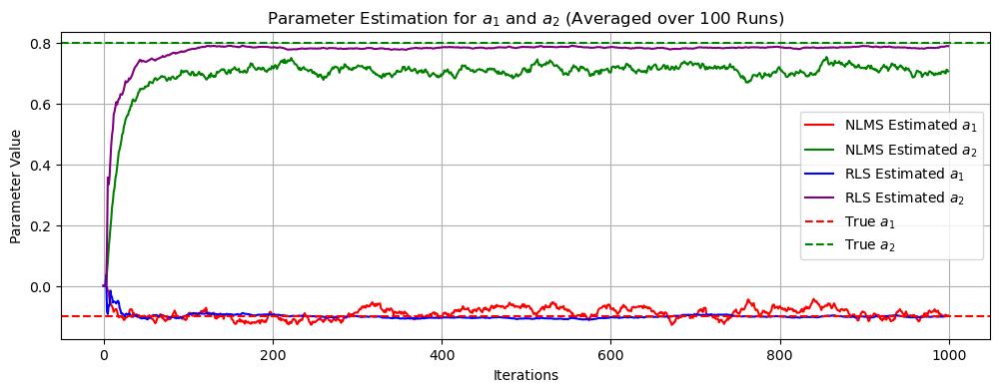

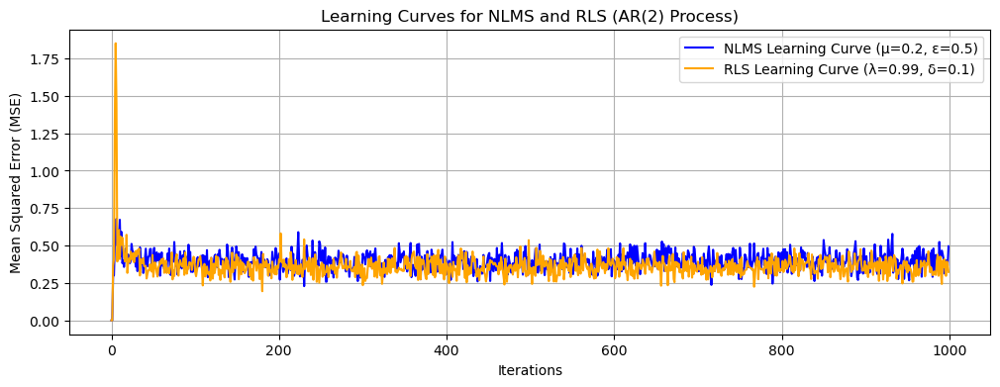

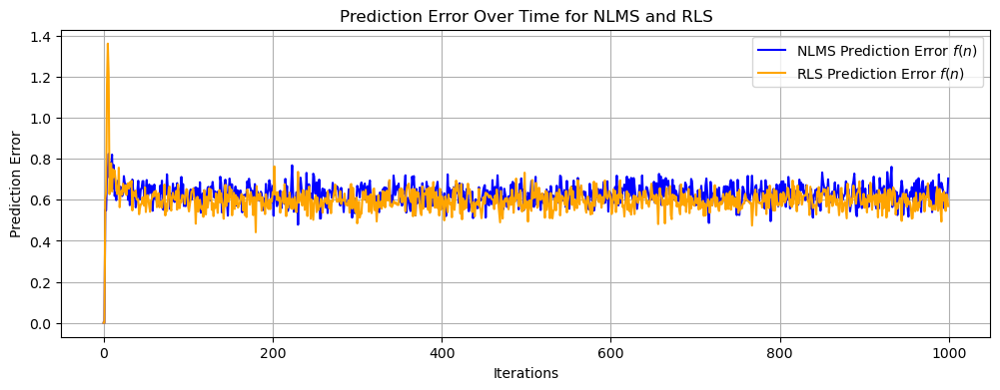

In [291]:
# Define AR(2) parameters
a1 = 0.1  # AR coefficient 1
a2 = -0.8  # AR coefficient 2
num_samples = 1000  # number of samples
sigma_v2 = 1 - (a1**2 + a2**2)  # noise variance for AR process
miu = 0.2  # step size for NLMS
epsilon = 0.5  # normalization factor for NLMS
lambda_rls = 0.99  # forgetting factor for RLS
delta_rls = 0.1  # regularization parameter for RLS
num_runs = 100  # number of Monte Carlo runs

print(f"Chosen NLMS μ: {miu}, RLS λ: {lambda_rls}, RLS δ: {delta_rls}")

# Compute learning curves and weights for NLMS
f_nlms, w_nlms = MC_simulation(a1, a2, sigma_v2, miu, epsilon, None, None, num_samples, num_runs, algorithm="NLMS")

# Compute learning curves and weights for RLS
f_rls, w_rls = MC_simulation(a1, a2, sigma_v2, None, None, lambda_rls, delta_rls, num_samples, num_runs, algorithm="RLS")

# Estimated parameters
estimated_a1_nlms = -w_nlms[-1, 0]
estimated_a2_nlms = -w_nlms[-1, 1]
estimated_a1_rls = -w_rls[-1, 0]
estimated_a2_rls = -w_rls[-1, 1]

# Display theoretical and estimated parameters
print(f"Theoretical a1: {a1}, Estimated a1 (NLMS): {estimated_a1_nlms:.4f}, Estimated a1 (RLS): {estimated_a1_rls:.4f}")
print(f"Theoretical a2: {a2}, Estimated a2 (NLMS): {estimated_a2_nlms:.4f}, Estimated a2 (RLS): {estimated_a2_rls:.4f}")

# Plot estimated parameters versus true values
plt.figure(figsize=(12, 4))
plt.plot(w_nlms[:, 0], label="NLMS Estimated $a_1$", color="red")
plt.plot(w_nlms[:, 1], label="NLMS Estimated $a_2$", color="green")
plt.plot(w_rls[:, 0], label="RLS Estimated $a_1$", color="blue")
plt.plot(w_rls[:, 1], label="RLS Estimated $a_2$", color="purple")
plt.axhline(y=-a1, color="red", linestyle="--", label="True $a_1$")
plt.axhline(y=-a2, color="green", linestyle="--", label="True $a_2$")
plt.title("Parameter Estimation for $a_1$ and $a_2$ (Averaged over 100 Runs)")
plt.xlabel("Iterations")
plt.ylabel("Parameter Value")
plt.grid(True)
plt.legend()
plt.show()

# Plot the learning curves
plt.figure(figsize=(12, 4))
plt.plot(f_nlms, label=f"NLMS Learning Curve (μ={miu}, ε={epsilon})", color="blue")
plt.plot(f_rls, label=f"RLS Learning Curve (λ={lambda_rls}, δ={delta_rls})", color="orange")
plt.title("Learning Curves for NLMS and RLS (AR(2) Process)")
plt.xlabel("Iterations")
plt.ylabel("Mean Squared Error (MSE)")
plt.grid(True)
plt.legend()
plt.show()

# Plot root mean squared error for NLMS and RLS
mse_nlms = np.sqrt(f_nlms)
mse_rls = np.sqrt(f_rls)
plt.figure(figsize=(12, 4))
plt.plot(mse_nlms, label="NLMS Prediction Error $f(n)$", color="blue")
plt.plot(mse_rls, label="RLS Prediction Error $f(n)$", color="orange")
plt.title("Prediction Error Over Time for NLMS and RLS")
plt.xlabel("Iterations")
plt.ylabel("Prediction Error")
plt.grid(True)
plt.legend()
plt.show()

### Analysis of Results

1. **Estimated Parameters**:
   - The theoretical parameters are $a_1 = 0.1$ and $a_2 = -0.8$.
   - **NLMS** estimates:  
     - $a_1 = 0.0995$ (very close to theoretical).  
     - $a_2 = -0.7051$ (some deviation from theoretical).  
   - **RLS** estimates:  
     - $a_1 = 0.0987$ (slightly less accurate than NLMS).  
     - $a_2 = -0.7884$ (much closer to the theoretical value compared to NLMS).

2. **Parameter Estimation**:
   - **NLMS** shows slower convergence and more fluctuations for $a_2$, as seen in the first plot.  
   - **RLS** demonstrates faster and more stable convergence for both parameters

3. **Learning Curves**:
   - Both algorithms achieve low steady-state MSE.  
   - **RLS** is consistently lower and less fluctuating than NLMS

4. **Prediction Error**:
   - The prediction error (third plot) for **RLS** is consistently lower and less fluctuating than NLMS, reflecting its robustness in parameter estimation.  

### Conclusion:
- **RLS** outperforms **NLMS** in terms of convergence speed and accuracy, particularly for $a_2$.  
- **NLMS** is computationally simpler but requires fine-tuning of parameters ($\mu$ and $\epsilon$) to achieve better accuracy.  
- Overall, **RLS** is more suited for tasks requiring precise parameter estimation in fewer iterations.

---

### **Part (b): Tap-Weight Error Analysis**

In this part, we compute and analyze the tap-weight errors $e_1(n)$ and $e_2(n)$ for both the **NLMS** and **RLS** algorithms.


Final prediction error (f[n]) for NLMS: 0.3733
Final prediction error (f[n]) for RLS: 0.3534
Final tap-weight error for a1 (NLMS): -0.0005
Final tap-weight error for a1 (RLS): -0.0013
Final tap-weight error for a2 (NLMS): 0.0949
Final tap-weight error for a2 (RLS): 0.0116


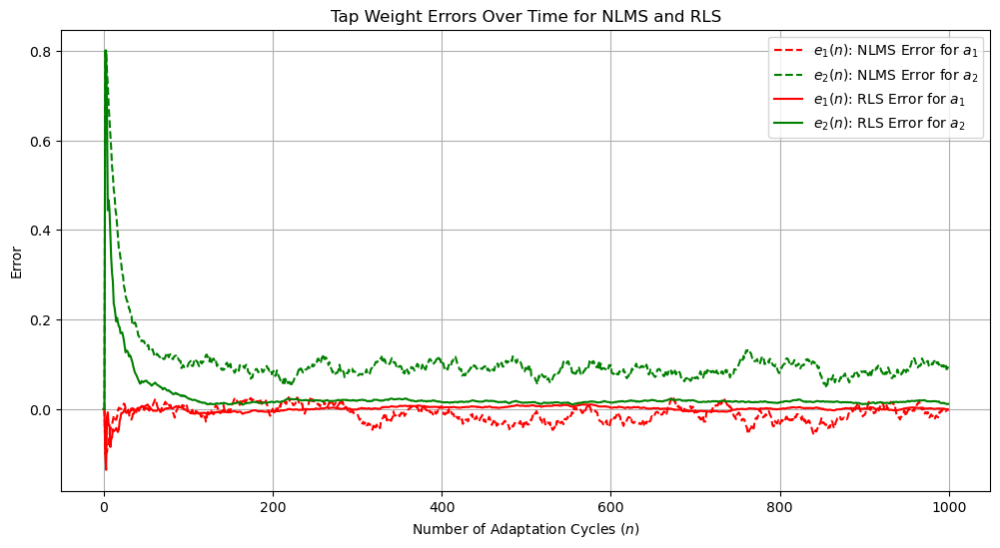

In [297]:
# Function to compute errors for averaged weights
def compute_errors(u, avg_weights, a1, a2, num_samples):
    f = np.zeros(num_samples)  # prediction error
    e1 = np.zeros(num_samples)  # tap-weight error for a1
    e2 = np.zeros(num_samples)  # tap-weight error for a2

    for n in range(2, num_samples):
        x = np.array([u[n - 1], u[n - 2]])  # input vector
        f[n] = u[n] - np.dot(avg_weights[n - 1], x)  # compute prediction error
        e1[n] = -a1 - avg_weights[n, 0]  # compute tap-weight error for a1
        e2[n] = -a2 - avg_weights[n, 1]  # compute tap-weight error for a2
    return f, e1, e2

# Generate AR(2) process
u = generate_ar2(a1, a2, sigma_v2, num_samples)  # generate AR(2) process

# Compute errors for NLMS
f_nlms, e1_nlms, e2_nlms = compute_errors(u, w_nlms, a1, a2, num_samples)  # compute errors for NLMS

# Compute errors for RLS
f_rls, e1_rls, e2_rls = compute_errors(u, w_rls, a1, a2, num_samples)  # compute errors for RLS

# Print final errors
print(f"Final prediction error (f[n]) for NLMS: {np.mean(f_nlms**2):.4f}")
print(f"Final prediction error (f[n]) for RLS: {np.mean(f_rls**2):.4f}")
print(f"Final tap-weight error for a1 (NLMS): {e1_nlms[-1]:.4f}")
print(f"Final tap-weight error for a1 (RLS): {e1_rls[-1]:.4f}")
print(f"Final tap-weight error for a2 (NLMS): {e2_nlms[-1]:.4f}")
print(f"Final tap-weight error for a2 (RLS): {e2_rls[-1]:.4f}")

# Plot tap-weight errors for NLMS and RLS
plt.figure(figsize=(12, 6))
plt.plot(e1_nlms, label="$e_1(n)$: NLMS Error for $a_1$", color="red", linestyle="--")
plt.plot(e2_nlms, label="$e_2(n)$: NLMS Error for $a_2$", color="green", linestyle="--")
plt.plot(e1_rls, label="$e_1(n)$: RLS Error for $a_1$", color="red", linestyle="-")
plt.plot(e2_rls, label="$e_2(n)$: RLS Error for $a_2$", color="green", linestyle="-")
plt.title("Tap Weight Errors Over Time for NLMS and RLS")
plt.xlabel("Number of Adaptation Cycles ($n$)")
plt.ylabel("Error")
plt.grid()
plt.legend()
plt.show()

### Analysis

- **Prediction Error:**  
  - RLS achieves a lower final prediction error (0.3534) compared to NLMS (0.3733), indicating better accuracy in minimizing $f(n)$.

- **Tap-Weight Errors:**  
  - For $a_1$, both algorithms perform well with errors close to zero, but NLMS has slightly less error ($-0.0005$ vs. $-0.0013$ for RLS).  
  - For $a_2$, RLS significantly outperforms NLMS, with a much smaller error ($0.0116$ vs. $0.0949$).

- **Conclusion:**  
  RLS demonstrates faster convergence and more precise estimation of parameters, particularly for $a_2$, while NLMS is slightly less accurate but computationally simpler.